<a href="https://colab.research.google.com/github/AshuPraja13/Data-Science/blob/main/Forecast_the_Walmart_Sales.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Table of Contents
1. Problem Statement
2. Project Objective
3. Data Description
4. Data Pre-processing Steps and Inspiration
5. Choosing the Algorithm for the Project
6. Motivation and Reasons For Choosing the Algorithm
7. Assumptions
8. Model Evaluation and Techniques
9. Inferences from the Same
10. Future Possibilities of the Project
11. Conclusion
12. References

## Problem Statement

The company is suffering from a financial crisis, and they want to manage their inventory in economical way to increase the profit margin by reducing the gap between supply and demand.

## Project Objective

The objective of this project is to use a predictive modeling techniques to forecast the sales for each store for the next 12
weeks.

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf
from sklearn.model_selection import train_test_split
from statsmodels.tsa.statespace.sarimax import SARIMAX,SARIMAXResults
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.stattools import acf,pacf,adfuller,kpss
from statsmodels.graphics.tsaplots import plot_acf,plot_pacf
from sklearn.metrics import mean_absolute_percentage_error,median_absolute_error,mean_absolute_error

## Data Description

The dataset available is a Weekly Sales data of Walmart from 45 different stores form the period of Feb 2010 to Oct 2012.

In [ ]:
df = pd.read_csv("D:\Intellipat\DL\Assignment\Walmart\Walmart.xls")
df

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
0,1,05-02-2010,1643690.90,0,42.31,2.572,211.096358,8.106
1,1,12-02-2010,1641957.44,1,38.51,2.548,211.242170,8.106
2,1,19-02-2010,1611968.17,0,39.93,2.514,211.289143,8.106
3,1,26-02-2010,1409727.59,0,46.63,2.561,211.319643,8.106
4,1,05-03-2010,1554806.68,0,46.50,2.625,211.350143,8.106
...,...,...,...,...,...,...,...,...
6430,45,28-09-2012,713173.95,0,64.88,3.997,192.013558,8.684
6431,45,05-10-2012,733455.07,0,64.89,3.985,192.170412,8.667
6432,45,12-10-2012,734464.36,0,54.47,4.000,192.327265,8.667
6433,45,19-10-2012,718125.53,0,56.47,3.969,192.330854,8.667


Let's make Date as an index column:

In [ ]:
df.Date = pd.to_datetime(df['Date'],format="%d-%m-%Y")
df.index = df.Date
df = df.drop(columns='Date')
df

,Store,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
Date,,,,,,,
2010-02-05,1,1643690.90,0,42.31,2.572,211.096358,8.106
2010-02-12,1,1641957.44,1,38.51,2.548,211.242170,8.106
2010-02-19,1,1611968.17,0,39.93,2.514,211.289143,8.106
2010-02-26,1,1409727.59,0,46.63,2.561,211.319643,8.106
2010-03-05,1,1554806.68,0,46.50,2.625,211.350143,8.106
...,...,...,...,...,...,...,...
2012-09-28,45,713173.95,0,64.88,3.997,192.013558,8.684
2012-10-05,45,733455.07,0,64.89,3.985,192.170412,8.667
2012-10-12,45,734464.36,0,54.47,4.000,192.327265,8.667


Dataset consist of 5 features and 1 labels, 143 data from each store. Data is collected on the interval of 7 days.

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 6435 entries, 2010-02-05 to 2012-10-26
Data columns (total 7 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Store         6435 non-null   int64  
 1   Weekly_Sales  6435 non-null   float64
 2   Holiday_Flag  6435 non-null   int64  
 3   Temperature   6435 non-null   float64
 4   Fuel_Price    6435 non-null   float64
 5   CPI           6435 non-null   float64
 6   Unemployment  6435 non-null   float64
dtypes: float64(5), int64(2)
memory usage: 402.2 KB


Available data is already cleaned at the source, therefore no extra cleaning is required.

In [ ]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Store,6435.0,2.300000e+01,12.988182,1.000,12.000,23.000000,3.400000e+01,4.500000e+01
Weekly_Sales,6435.0,1.046965e+06,564366.622054,209986.250,553350.105,960746.040000,1.420159e+06,3.818686e+06
Holiday_Flag,6435.0,6.993007e-02,0.255049,0.000,0.000,0.000000,0.000000e+00,1.000000e+00
Temperature,6435.0,6.066378e+01,18.444933,-2.060,47.460,62.670000,7.494000e+01,1.001400e+02
Fuel_Price,6435.0,3.358607e+00,0.459020,2.472,2.933,3.445000,3.735000e+00,4.468000e+00
CPI,6435.0,1.715784e+02,39.356712,126.064,131.735,182.616521,2.127433e+02,2.272328e+02
Unemployment,6435.0,7.999151e+00,1.875885,3.879,6.891,7.874000,8.622000e+00,1.431300e+01


Different stores in the datasets:

In [ ]:
df.Store.unique()

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34,
       35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45], dtype=int64)

Ploting Weekly Sales of all stores during the span of time

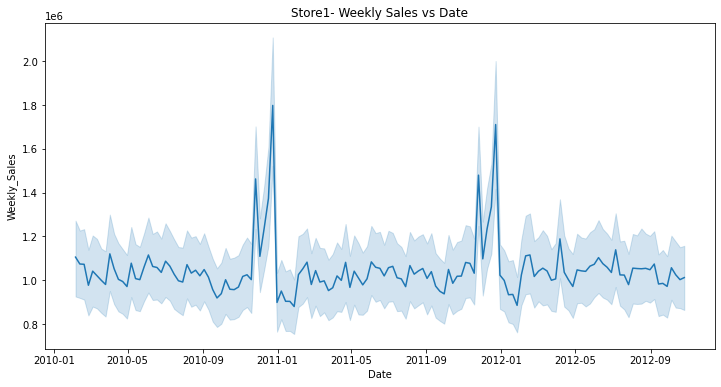

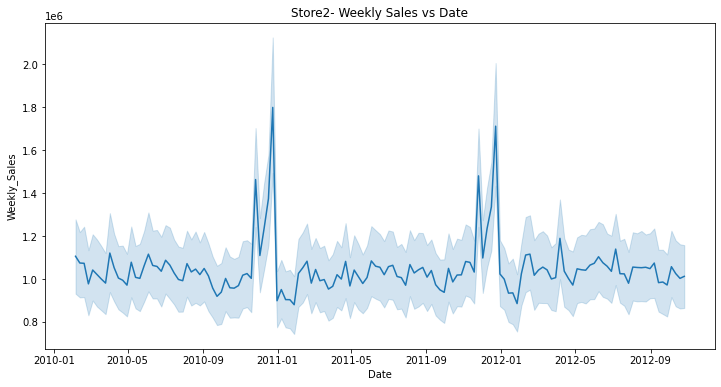

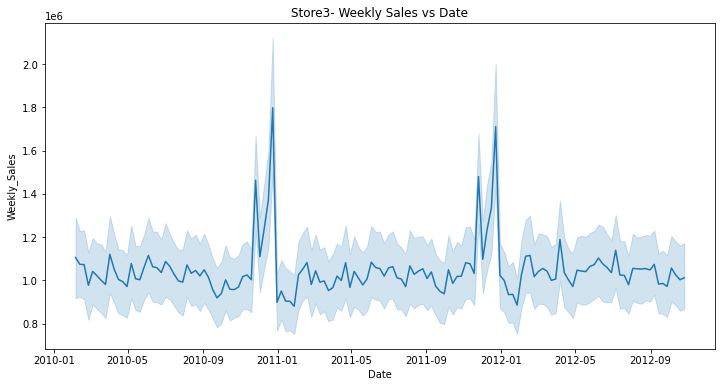

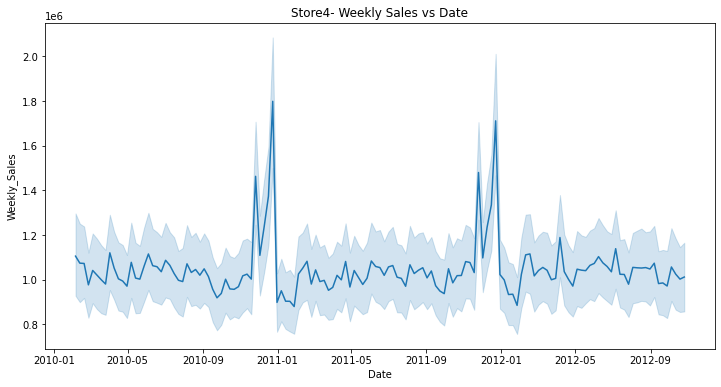

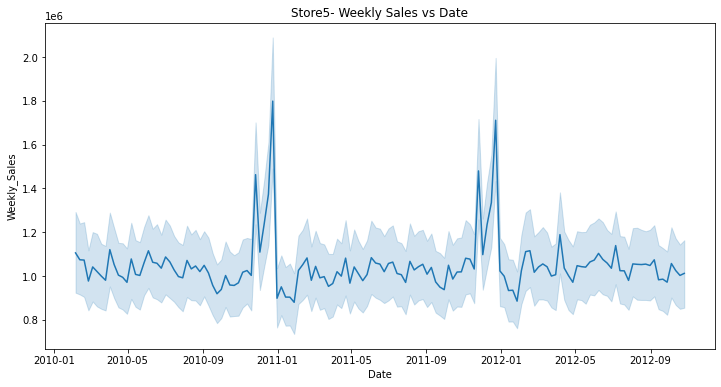

...

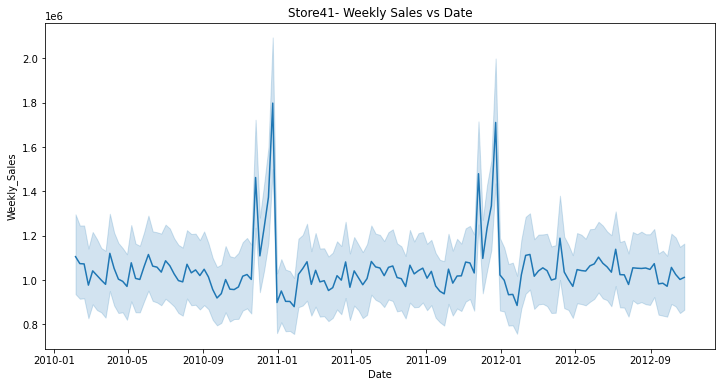

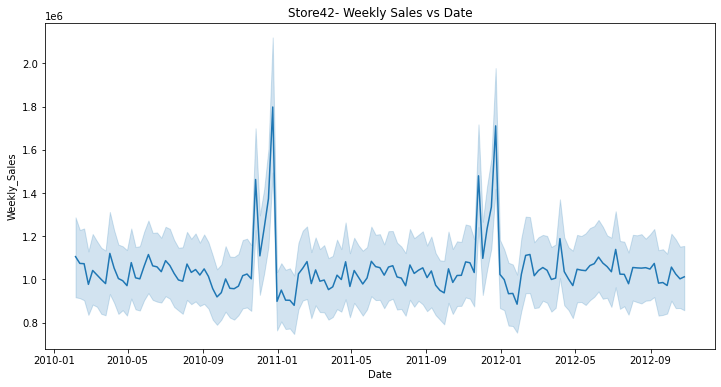

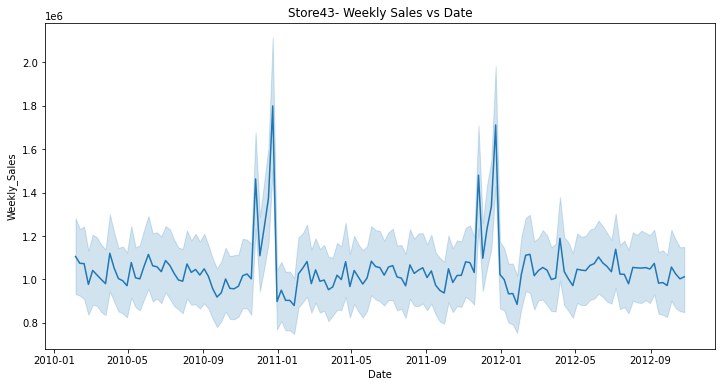

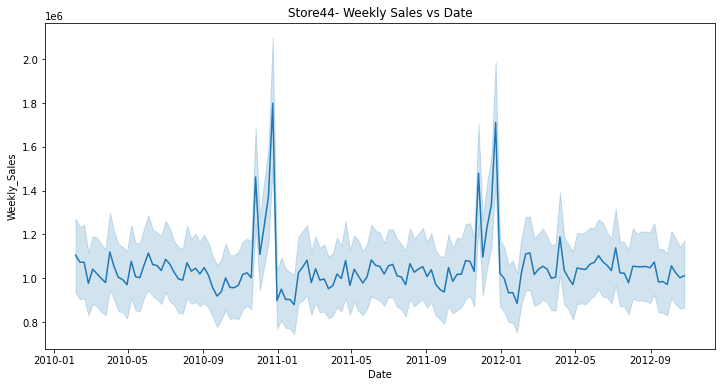

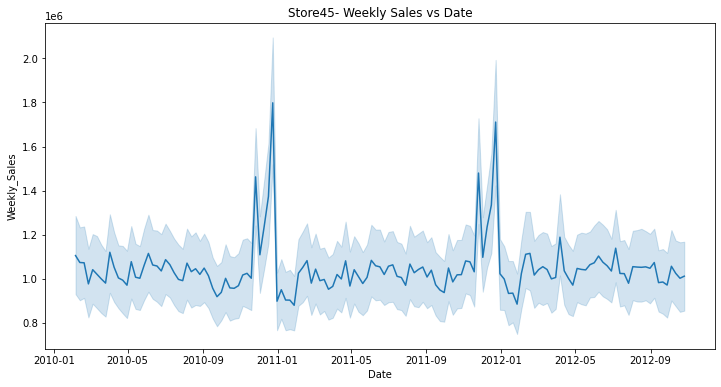

In [ ]:
for i in df.Store.unique():
    plt.figure(figsize=(12,6))
    sns.lineplot(x=df.index,y=df.Weekly_Sales)
    plt.title(f"Store{i}- Weekly Sales vs Date")
    plt.show()

It is clearily visible form the plot that there is a sudden increase in sales of every store at the time of year end. This represents the Seasonal trend.
It may be due to <br>
1. Chrismas eve
2. Year end sale
3. New year shopping

### Temperature VS Sales

Correlation between Weekly Sales and Unemployment of Store1 is -0.22270055855381077


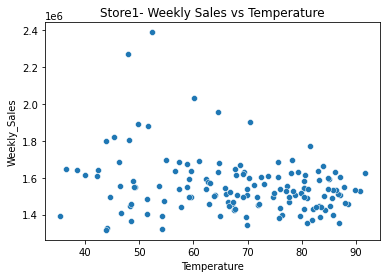

Correlation between Weekly Sales and Unemployment of Store2 is -0.29767311082802705


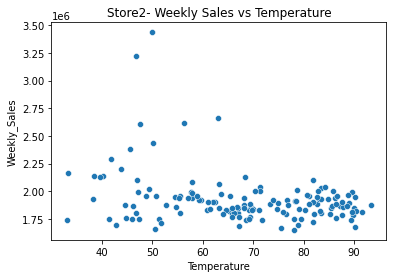

Correlation between Weekly Sales and Unemployment of Store3 is -0.37752429358720924


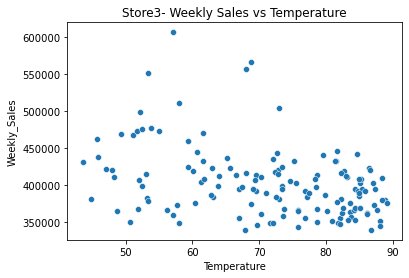

Correlation between Weekly Sales and Unemployment of Store4 is -0.2255825417409482


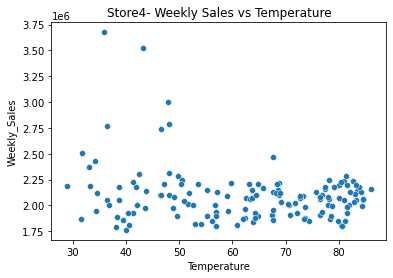

Correlation between Weekly Sales and Unemployment of Store5 is -0.17551687386901318


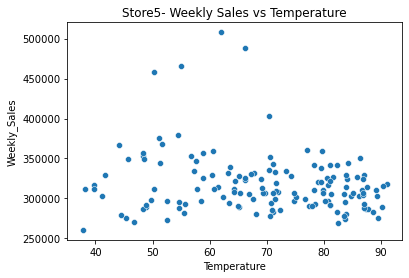

Correlation between Weekly Sales and Unemployment of Store6 is -0.08486307511582623


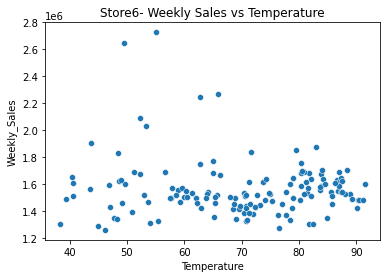

Correlation between Weekly Sales and Unemployment of Store7 is 0.01507746259919502


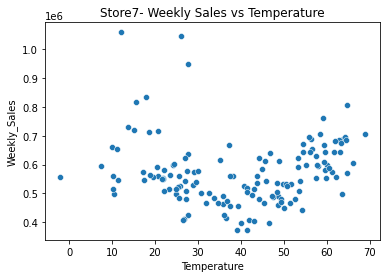

Correlation between Weekly Sales and Unemployment of Store8 is -0.3123237415376159


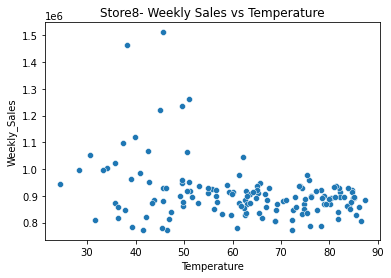

Correlation between Weekly Sales and Unemployment of Store9 is -0.20834332242220086


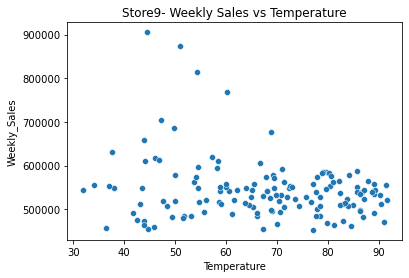

Correlation between Weekly Sales and Unemployment of Store10 is -0.4325686888435955


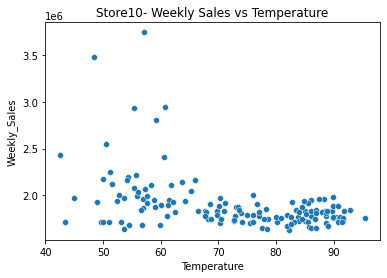

Correlation between Weekly Sales and Unemployment of Store11 is -0.27850279002004363


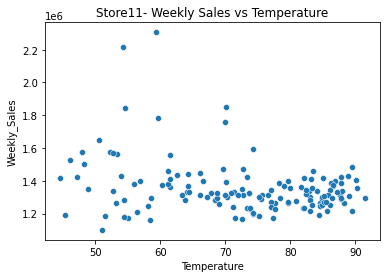

Correlation between Weekly Sales and Unemployment of Store12 is -0.37941565849924175


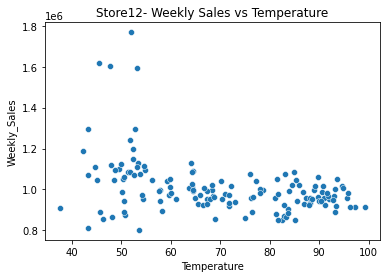

Correlation between Weekly Sales and Unemployment of Store13 is -0.13774557508715055


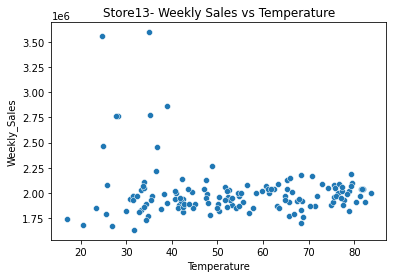

Correlation between Weekly Sales and Unemployment of Store14 is -0.1998514916576683


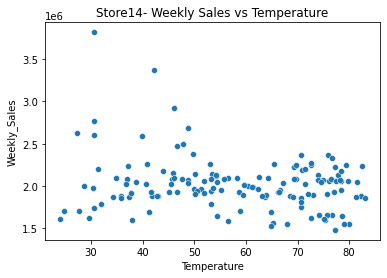

Correlation between Weekly Sales and Unemployment of Store15 is -0.050541340536474626


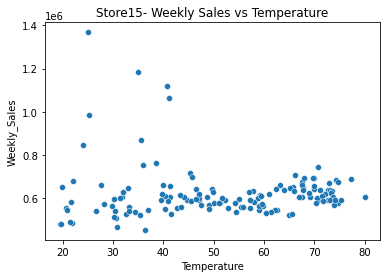

Correlation between Weekly Sales and Unemployment of Store16 is 0.18294807425152856


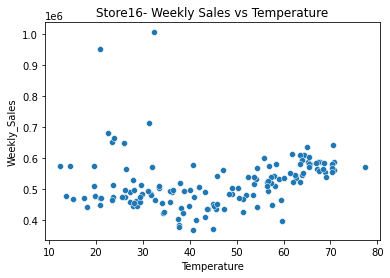

Correlation between Weekly Sales and Unemployment of Store17 is 0.0810121664077016


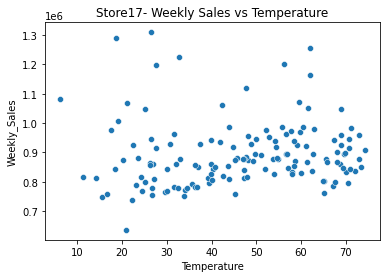

Correlation between Weekly Sales and Unemployment of Store18 is -0.14427783500673316


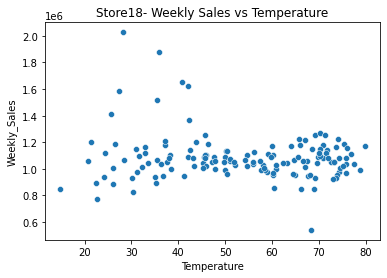

Correlation between Weekly Sales and Unemployment of Store19 is -0.08080507852114376


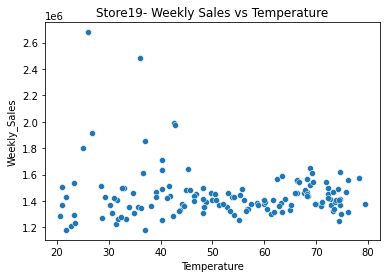

Correlation between Weekly Sales and Unemployment of Store20 is -0.2649832854698795


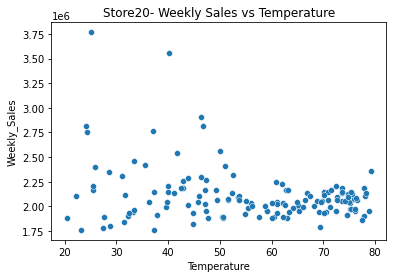

Correlation between Weekly Sales and Unemployment of Store21 is -0.17708437094189414


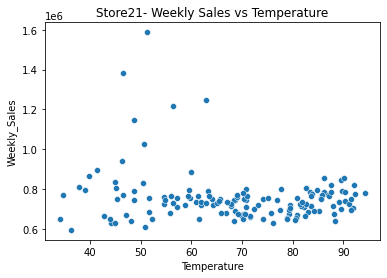

Correlation between Weekly Sales and Unemployment of Store22 is -0.08289190515894695


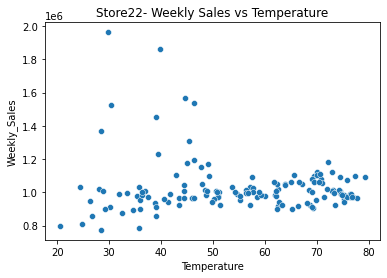

Correlation between Weekly Sales and Unemployment of Store23 is 0.05625736322525011


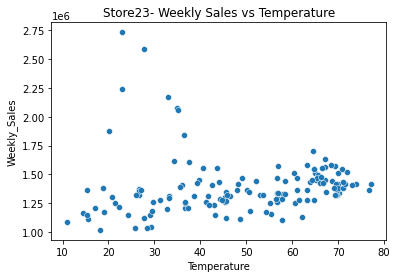

Correlation between Weekly Sales and Unemployment of Store24 is 0.11183321114122231


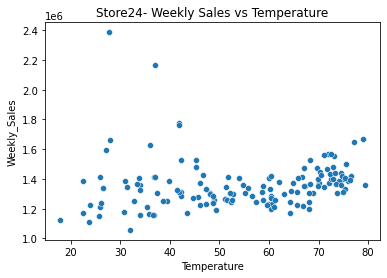

Correlation between Weekly Sales and Unemployment of Store25 is -0.031311150346977755


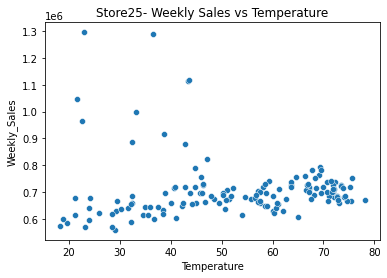

Correlation between Weekly Sales and Unemployment of Store26 is 0.21172207626532563


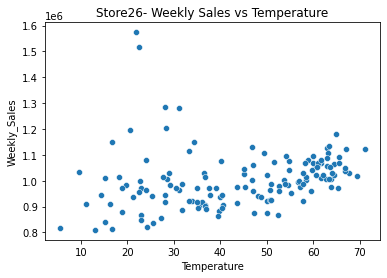

Correlation between Weekly Sales and Unemployment of Store27 is 0.12180917508698373


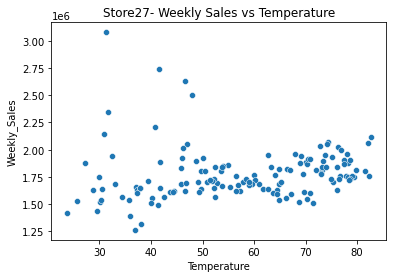

Correlation between Weekly Sales and Unemployment of Store28 is -0.37650606013576654


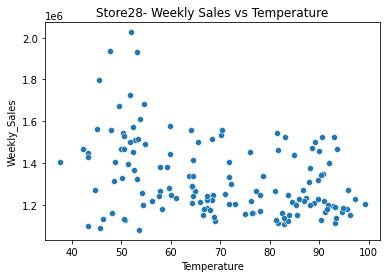

Correlation between Weekly Sales and Unemployment of Store29 is -0.12914402773073894


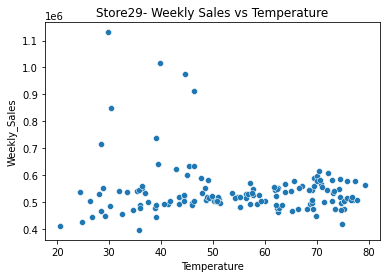

Correlation between Weekly Sales and Unemployment of Store30 is -0.33081629619662123


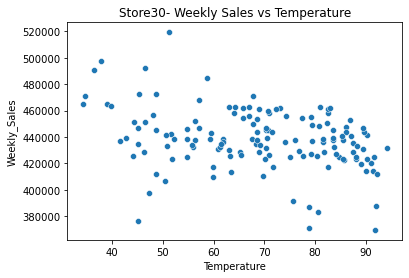

Correlation between Weekly Sales and Unemployment of Store31 is -0.26219191391866525


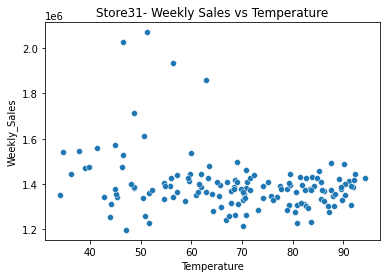

Correlation between Weekly Sales and Unemployment of Store32 is -0.11168119456366442


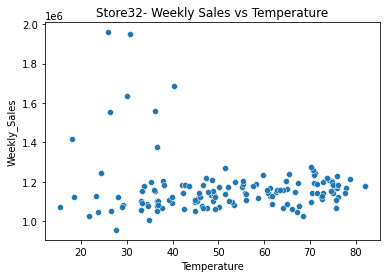

Correlation between Weekly Sales and Unemployment of Store33 is 0.01924414787413381


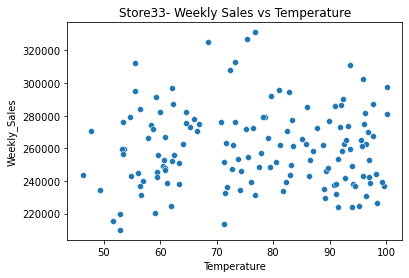

Correlation between Weekly Sales and Unemployment of Store34 is -0.2785228198088511


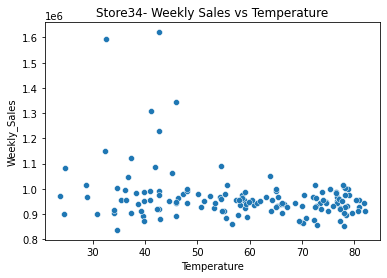

Correlation between Weekly Sales and Unemployment of Store35 is 0.04339173108034861


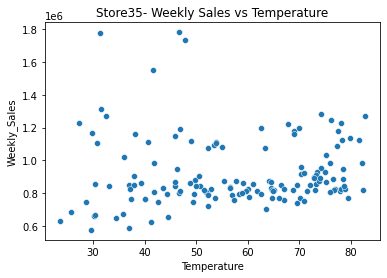

Correlation between Weekly Sales and Unemployment of Store36 is -0.0944535654051107


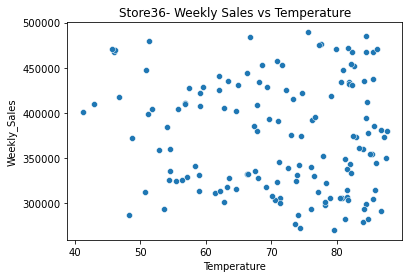

Correlation between Weekly Sales and Unemployment of Store37 is -0.3004934224173777


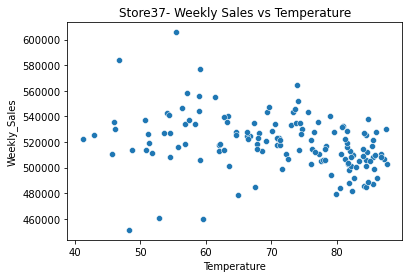

Correlation between Weekly Sales and Unemployment of Store38 is 0.03299319368083145


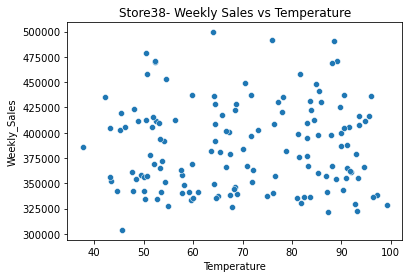

Correlation between Weekly Sales and Unemployment of Store39 is 0.06473759689620633


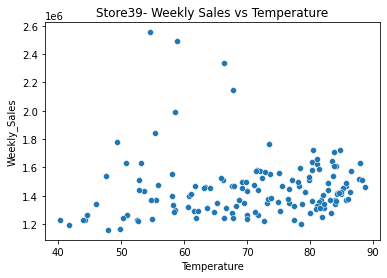

Correlation between Weekly Sales and Unemployment of Store40 is 0.09059847754779318


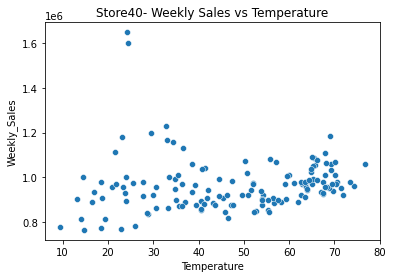

Correlation between Weekly Sales and Unemployment of Store41 is 0.10676128742434907


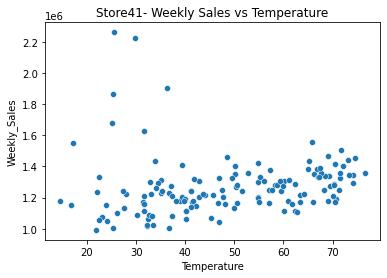

Correlation between Weekly Sales and Unemployment of Store42 is -0.15163896077058045


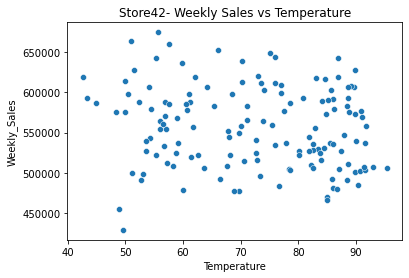

Correlation between Weekly Sales and Unemployment of Store43 is 0.09527185928907092


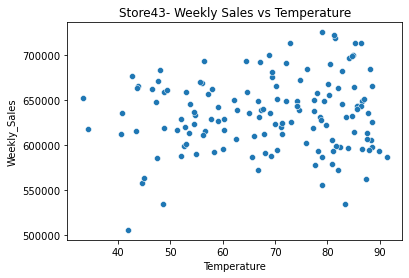

Correlation between Weekly Sales and Unemployment of Store44 is 0.267822192302317


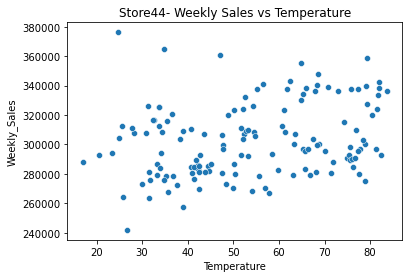

Correlation between Weekly Sales and Unemployment of Store45 is -0.20194545108496362


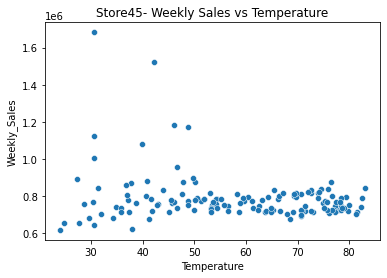

In [ ]:
for i in df.Store.unique():
#     plt.figure(figsize=(12,6))
    sns.scatterplot(x=df[df.Store==i].Temperature,y=df[df.Store==i].Weekly_Sales)
    plt.title(f"Store{i}- Weekly Sales vs Temperature")
    print(f"Correlation between Weekly Sales and Unemployment of Store{i} is {df[df.Store==i].Weekly_Sales.corr(df[df.Store==i].Temperature)}")
    plt.show()

It can be concluded from above plot that for the region weekly sales increases a bit when weather is cool, it means people prefer shopping in cool weather.

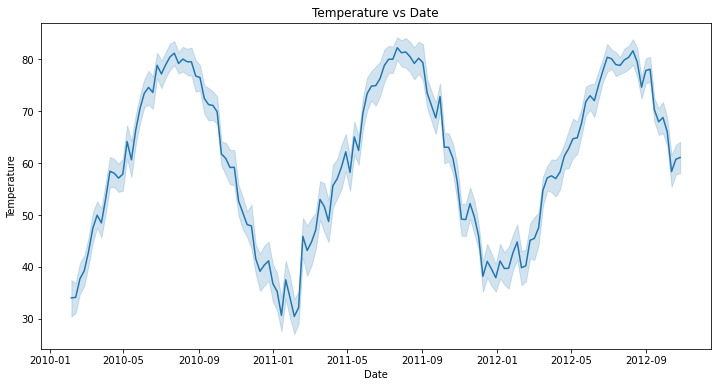

In [ ]:
plt.figure(figsize=(12,6))
sns.lineplot(x=df.index,y=df.Temperature)
plt.title("Temperature vs Date")
plt.show()

Comparing Temperature vs Date vs Weekly Sales collectively, there don't seams to be much correlation between temperature and Sales.

### CPI vs Sales

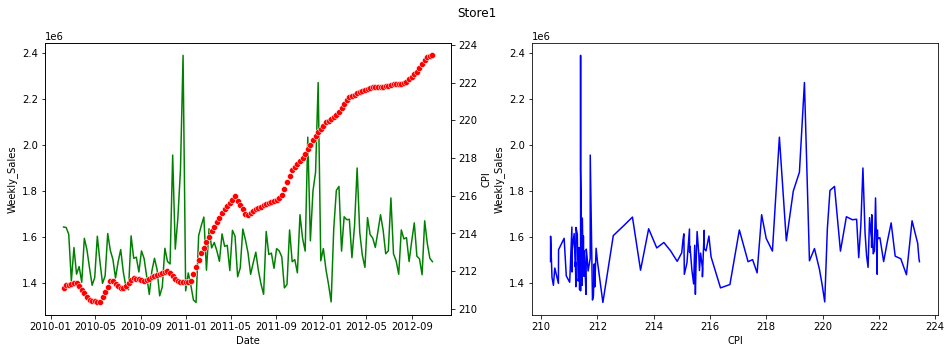

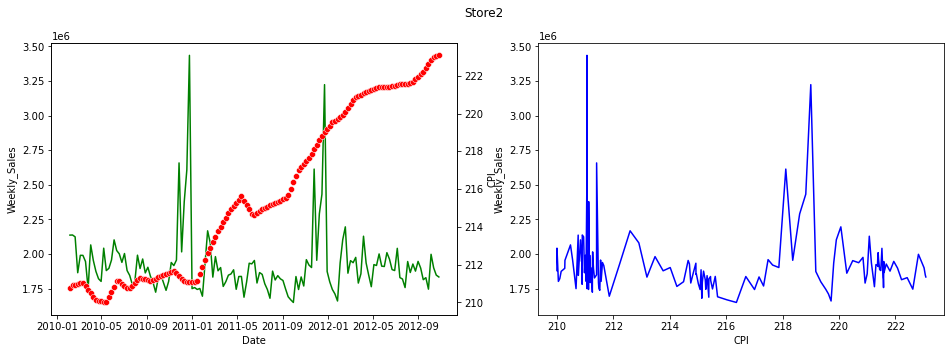

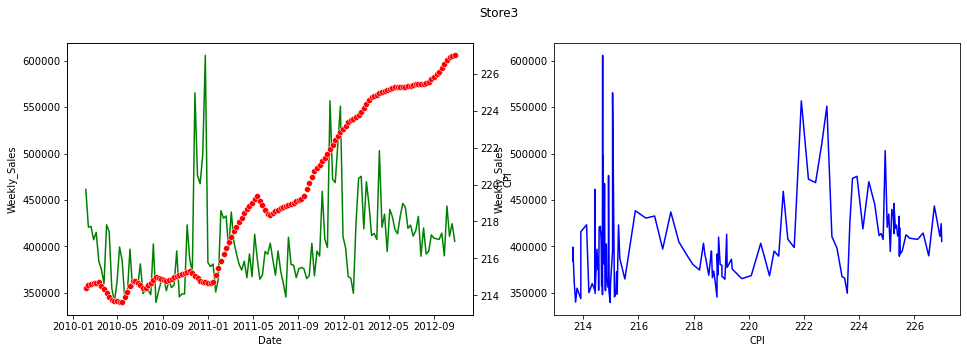

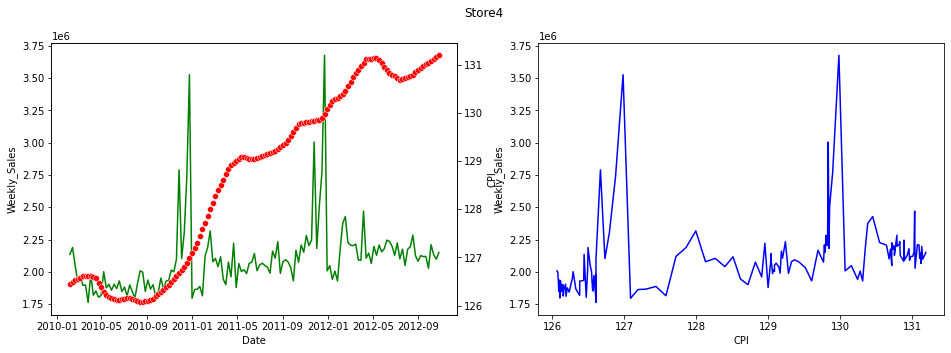

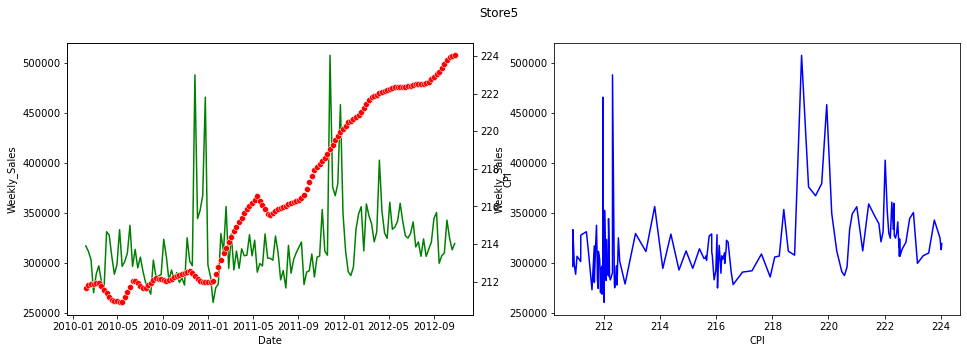

...

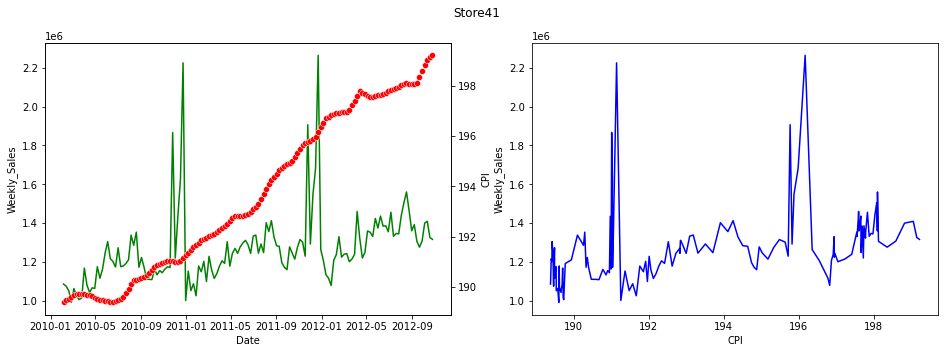

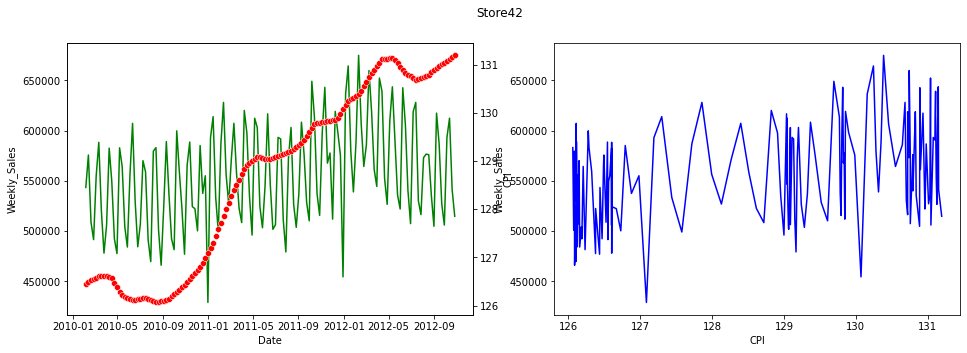

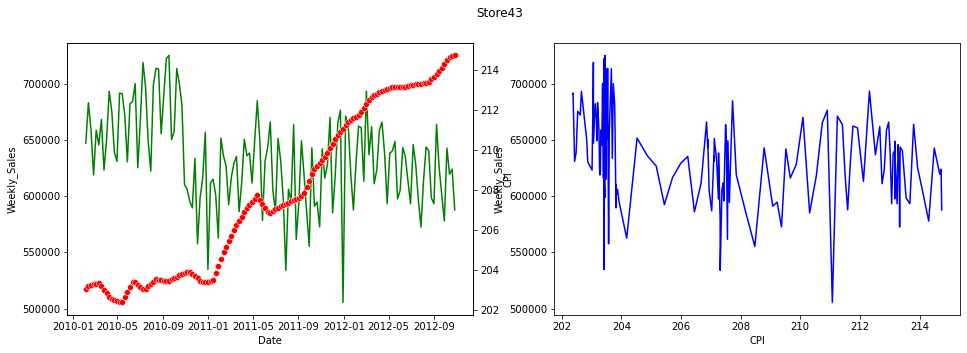

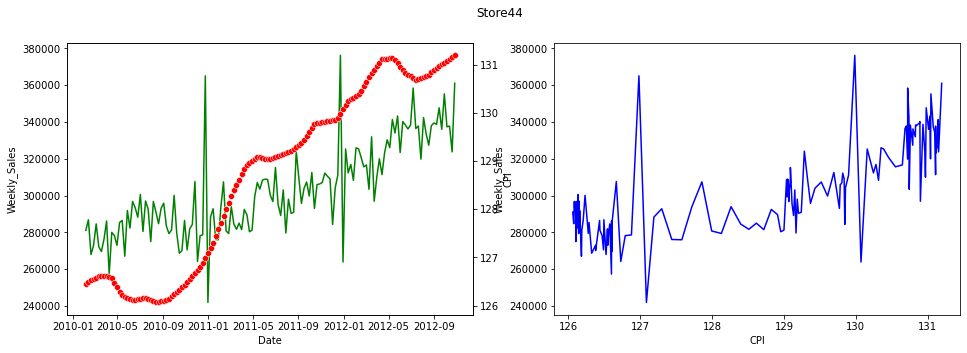

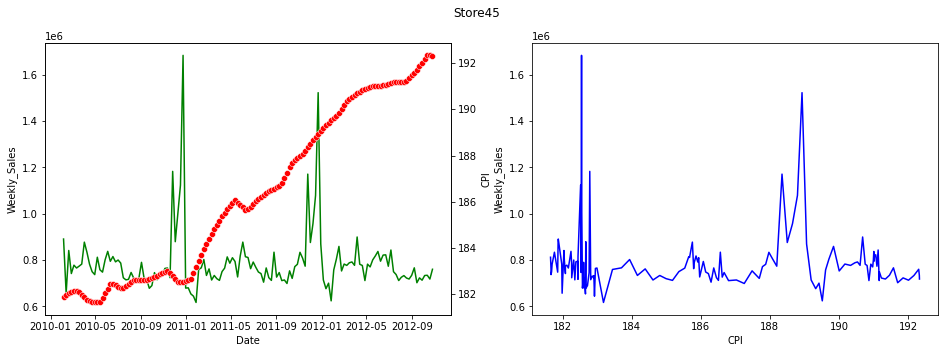

In [ ]:
for i in df.Store.unique():
  plt.figure(figsize=(16,5))
  plt.subplot(1,2,1)
  sns.lineplot(x=df[df.Store==i].index,y=df[df.Store==i].Weekly_Sales,color='green')
  sns.scatterplot(x=df[df.Store==i].index,y=df[df.Store==i].CPI,ax=plt.twinx(),color='red')
  plt.subplot(1,2,2)
  sns.lineplot(x=df[df.Store==i].CPI,y=df[df.Store==i].Weekly_Sales,color='blue')
  plt.suptitle(f"Store{i}")
  plt.show()

CPI is having a Possitive impact on Store-38 & Store-44 and Negative impact on Store-36.

### Unemployment rate vs Sales

Correlation between Weekly Sales and Unemployment of Store1 is -0.0979553947295795


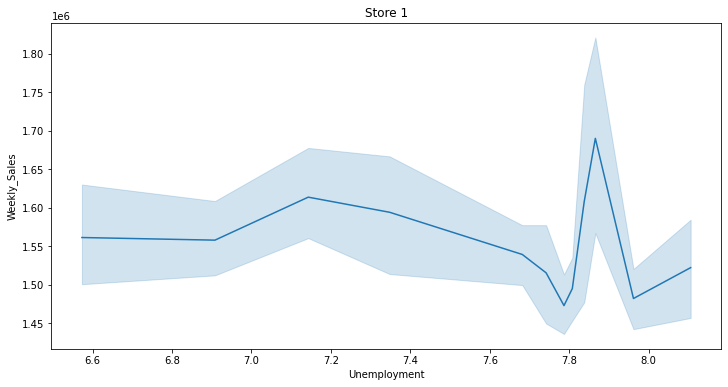

Correlation between Weekly Sales and Unemployment of Store2 is 0.06632485967770846


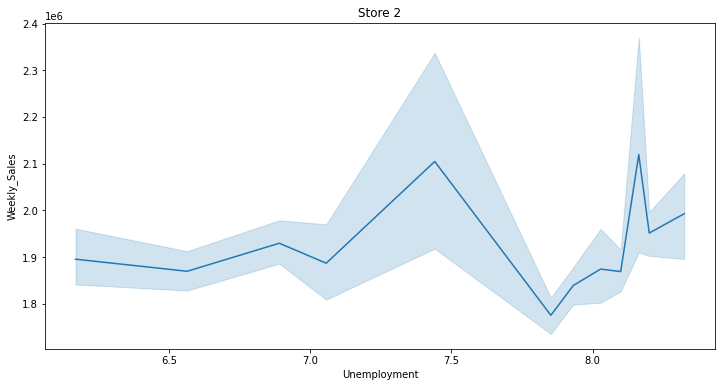

Correlation between Weekly Sales and Unemployment of Store3 is -0.2304130134863526


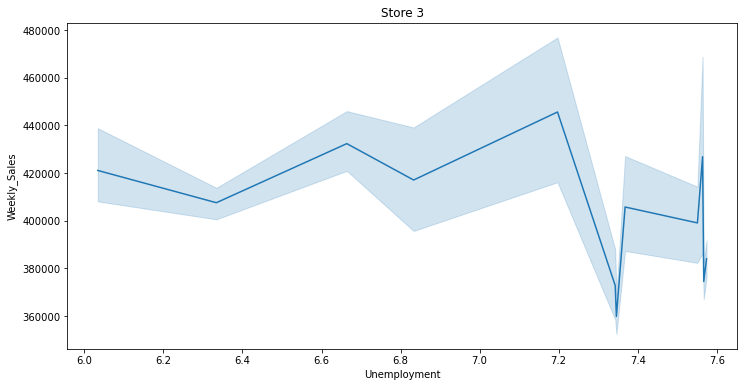

Correlation between Weekly Sales and Unemployment of Store4 is -0.3370151956445587


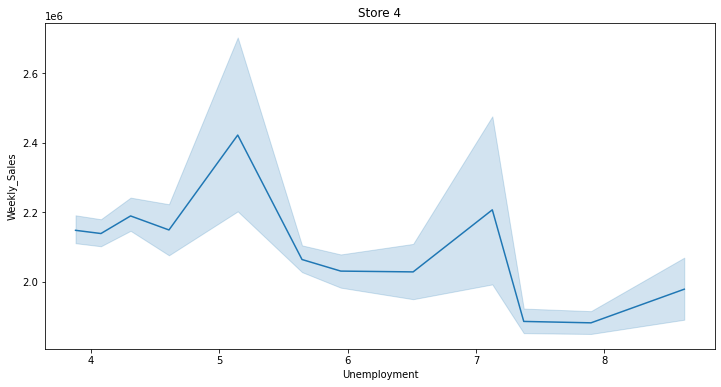

Correlation between Weekly Sales and Unemployment of Store5 is -0.20704271031605842


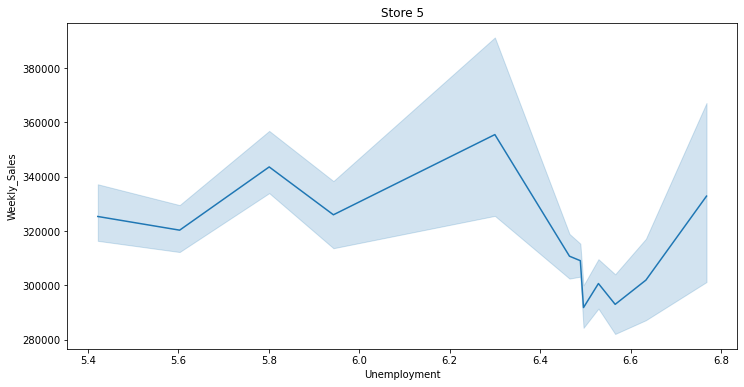

Correlation between Weekly Sales and Unemployment of Store6 is 0.044250821015624046


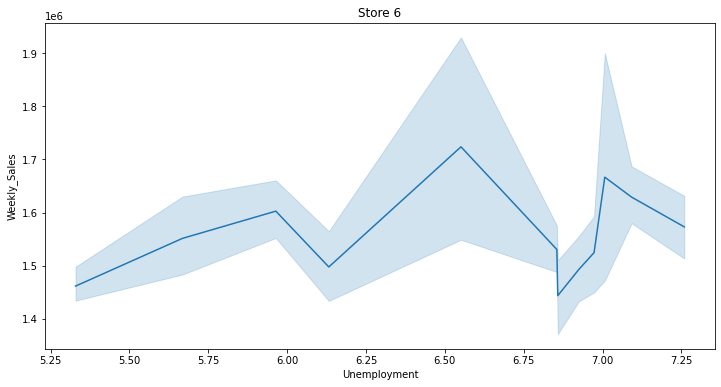

Correlation between Weekly Sales and Unemployment of Store7 is -0.16538168270129636


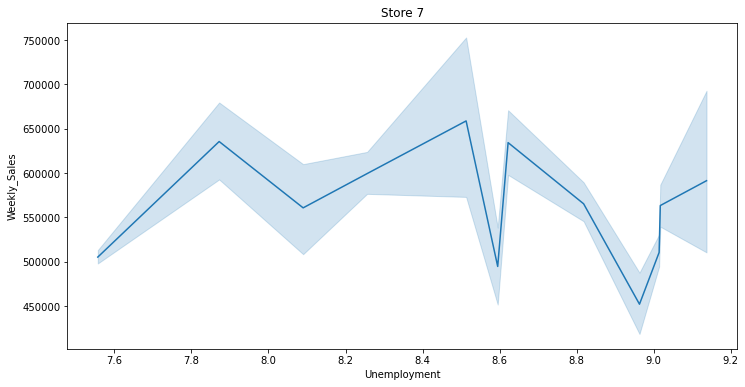

Correlation between Weekly Sales and Unemployment of Store8 is -0.05257964619712677


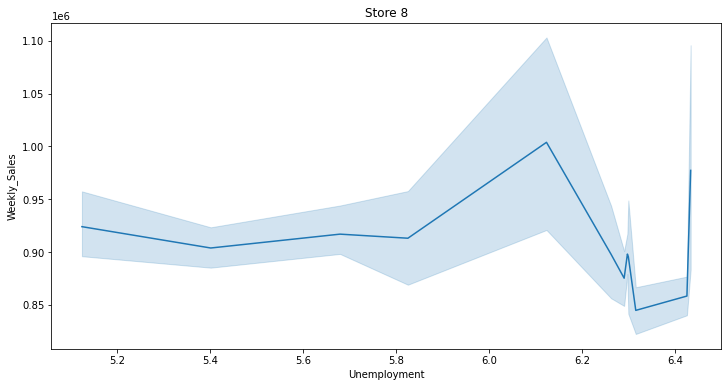

Correlation between Weekly Sales and Unemployment of Store9 is -0.1915343637022839


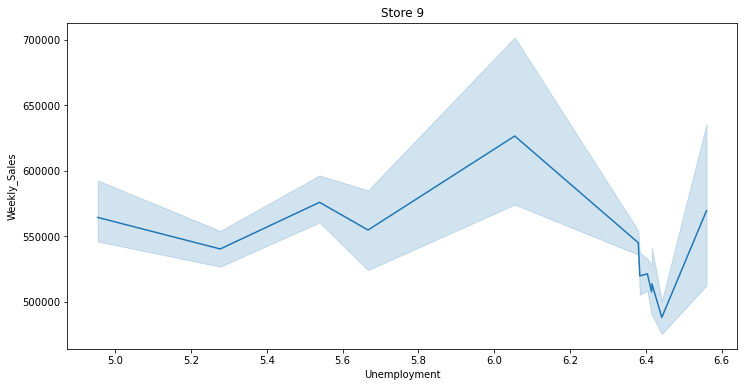

Correlation between Weekly Sales and Unemployment of Store10 is 0.13190762207746096


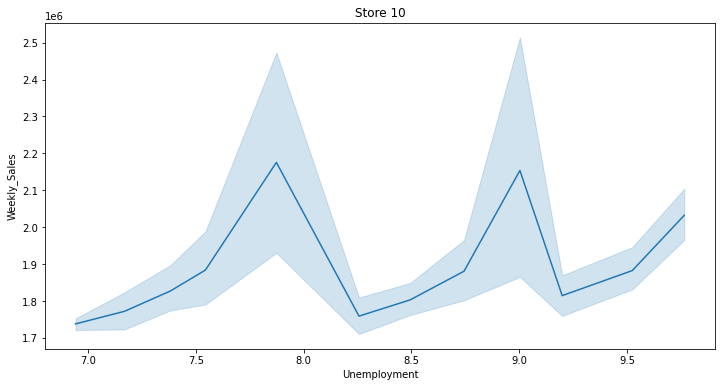

Correlation between Weekly Sales and Unemployment of Store11 is -0.020338971133082306


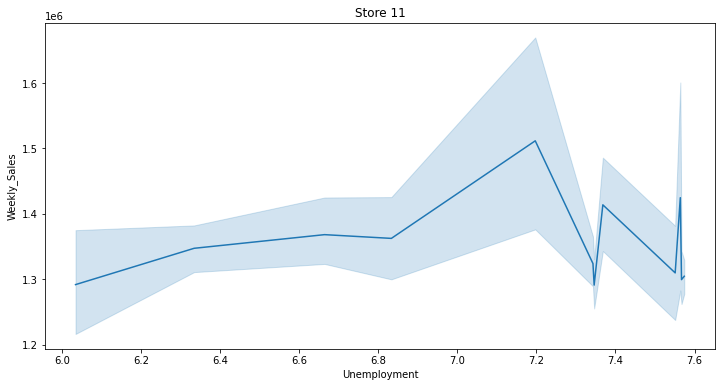

Correlation between Weekly Sales and Unemployment of Store12 is -0.009286099902746538


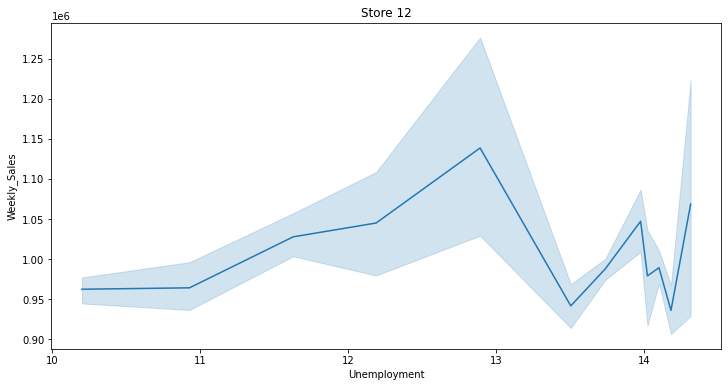

Correlation between Weekly Sales and Unemployment of Store13 is -0.1716328688963503


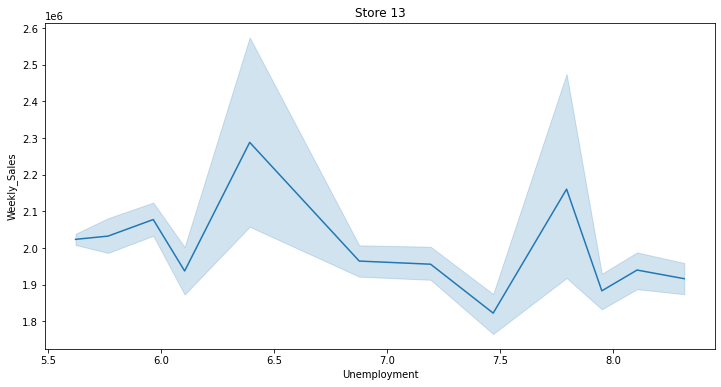

Correlation between Weekly Sales and Unemployment of Store14 is 0.2107864829459358


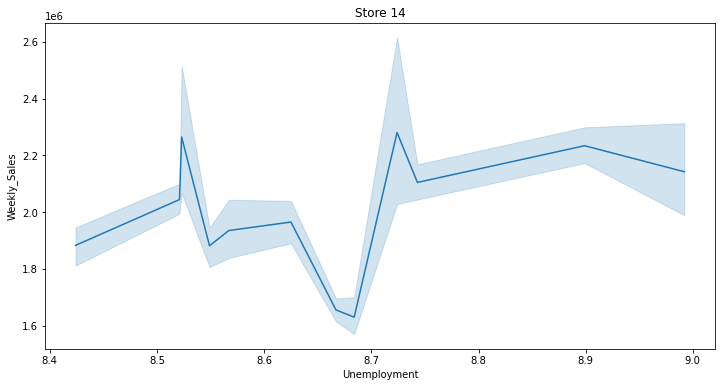

Correlation between Weekly Sales and Unemployment of Store15 is 0.0789053686051426


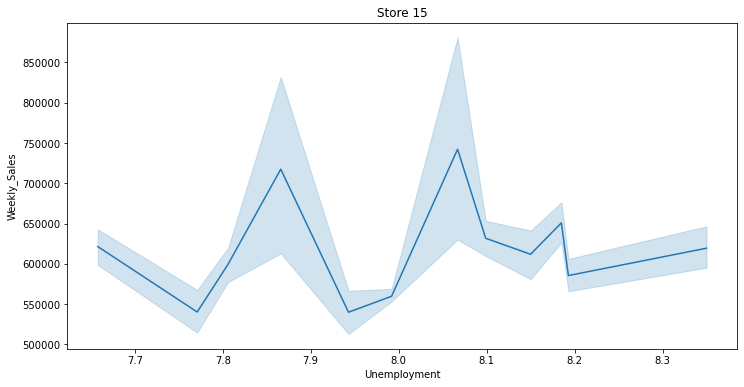

Correlation between Weekly Sales and Unemployment of Store16 is -0.07086358405192238


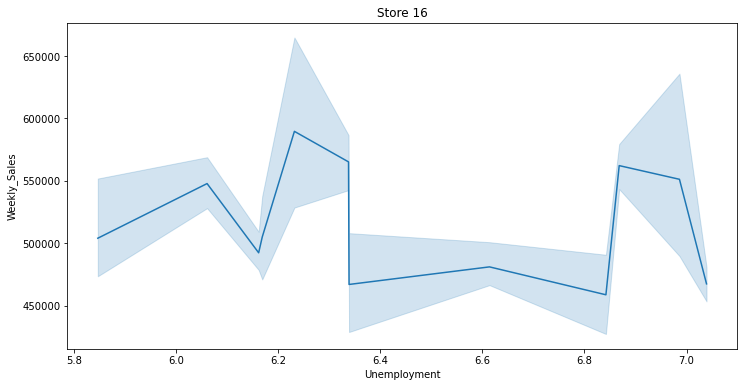

Correlation between Weekly Sales and Unemployment of Store17 is -0.26359968183073906


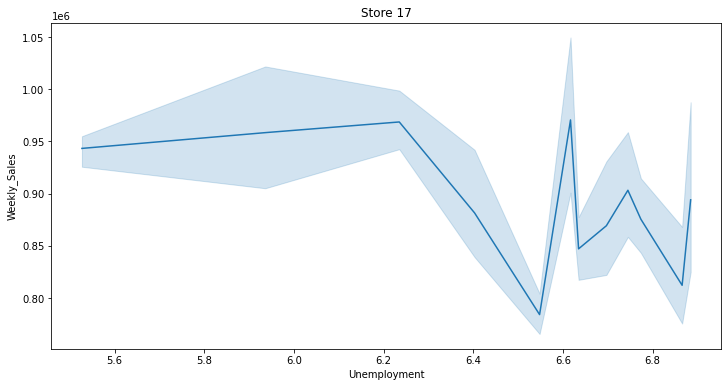

Correlation between Weekly Sales and Unemployment of Store18 is 0.13917900226669452


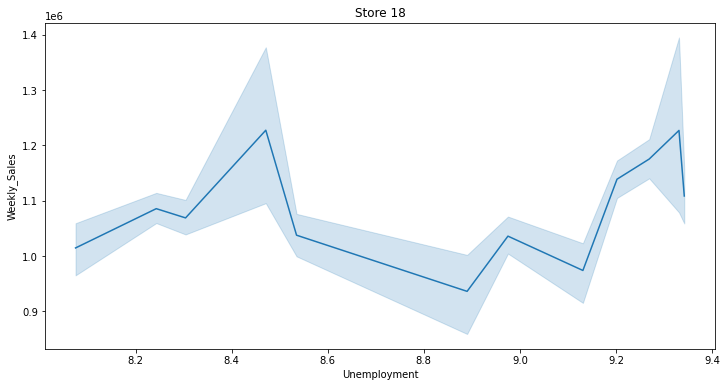

Correlation between Weekly Sales and Unemployment of Store19 is 0.10146392090273439


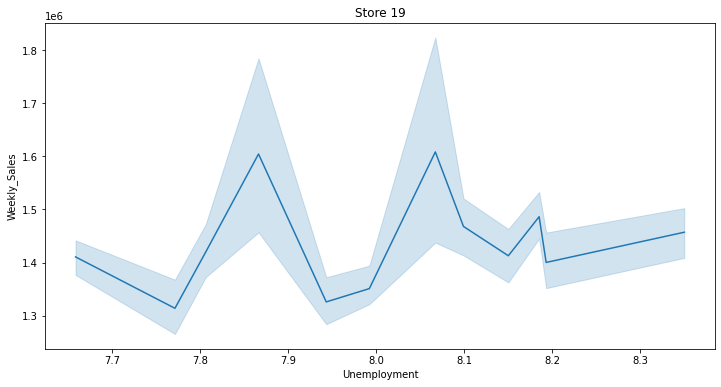

Correlation between Weekly Sales and Unemployment of Store20 is -0.09534134450284637


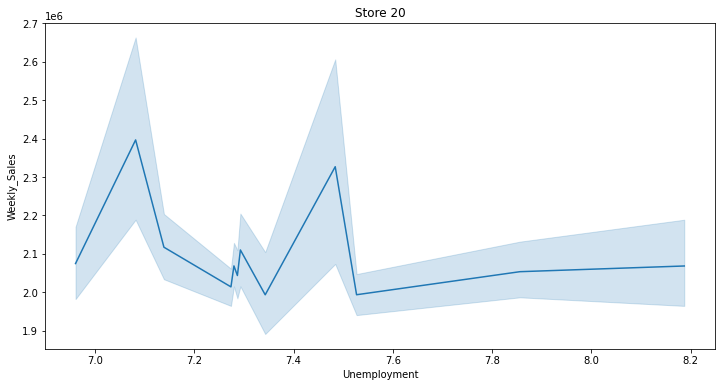

Correlation between Weekly Sales and Unemployment of Store21 is 0.21836733305703376


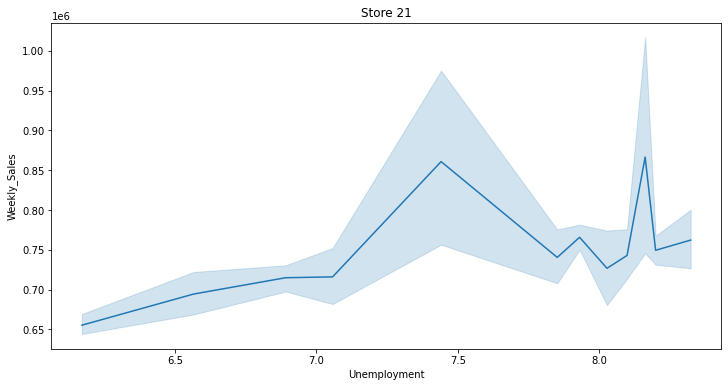

Correlation between Weekly Sales and Unemployment of Store22 is 0.039042867355347455


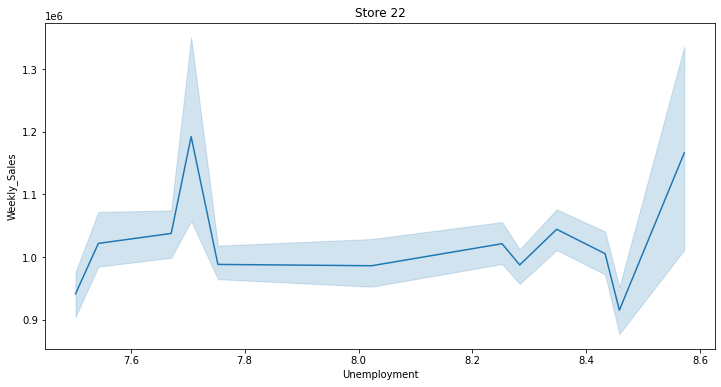

Correlation between Weekly Sales and Unemployment of Store23 is -0.07716899559088829


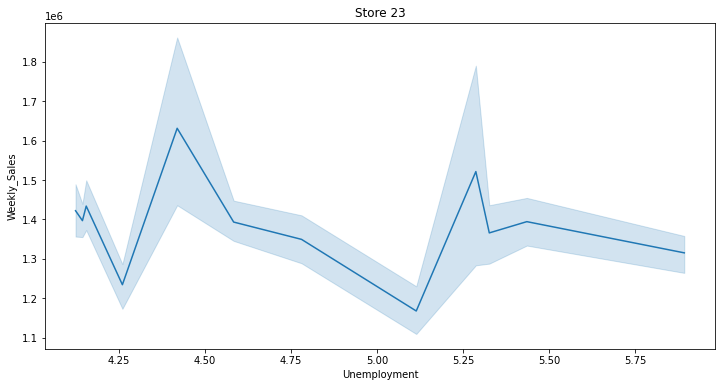

Correlation between Weekly Sales and Unemployment of Store24 is -0.012260801238922888


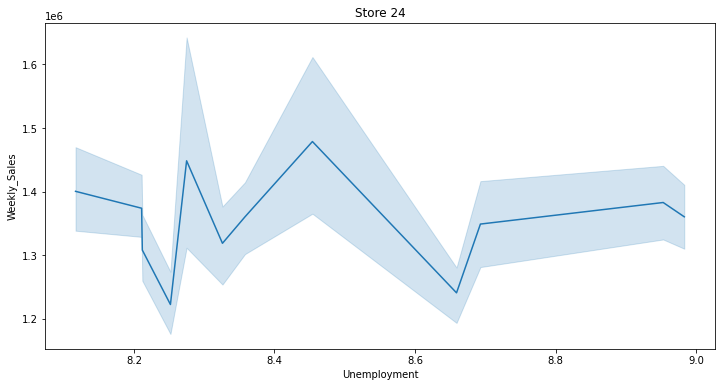

Correlation between Weekly Sales and Unemployment of Store25 is -0.004957651760361549


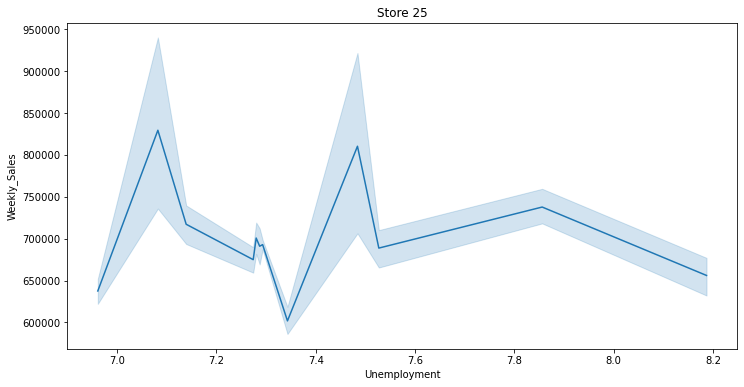

Correlation between Weekly Sales and Unemployment of Store26 is -0.06689910263473302


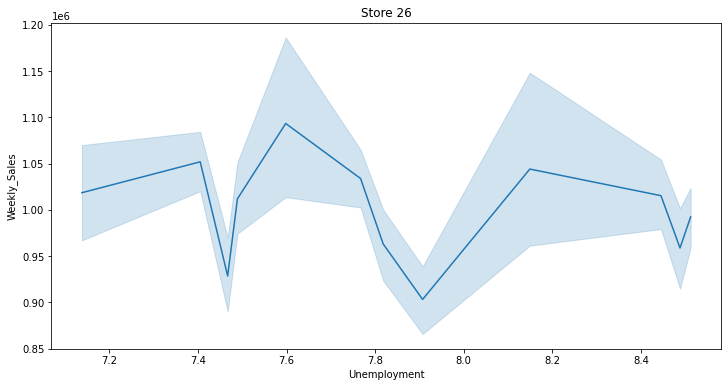

Correlation between Weekly Sales and Unemployment of Store27 is -0.0142750519412613


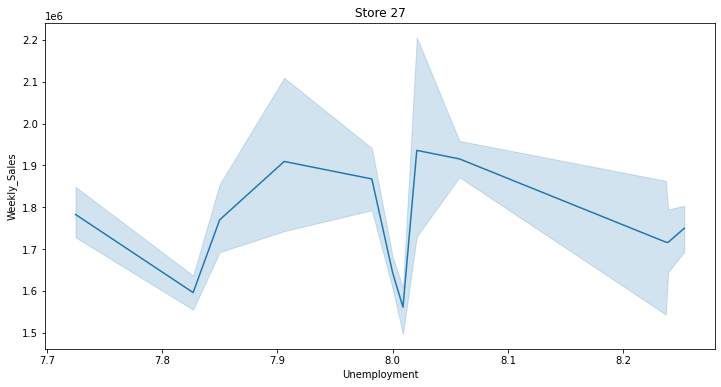

Correlation between Weekly Sales and Unemployment of Store28 is 0.1366706817794531


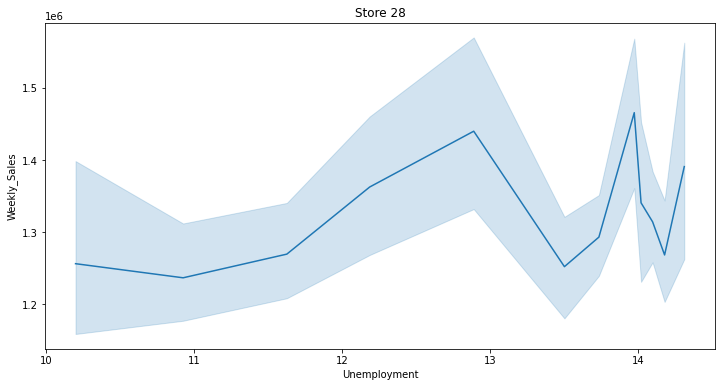

Correlation between Weekly Sales and Unemployment of Store29 is 0.08468168200648409


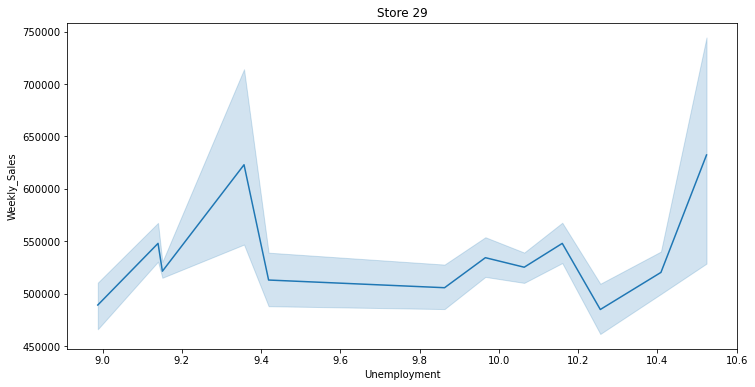

Correlation between Weekly Sales and Unemployment of Store30 is 0.20186223641523895


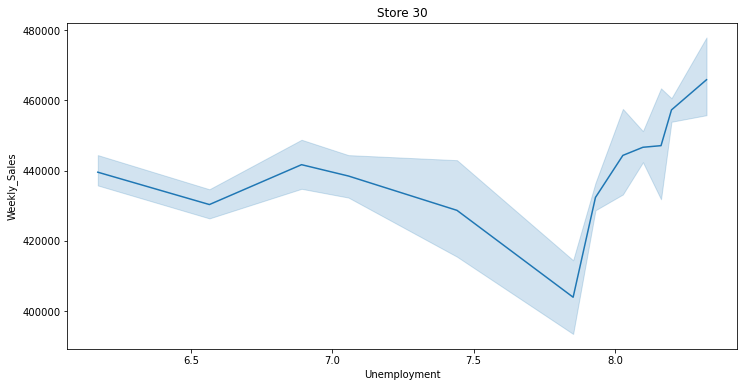

Correlation between Weekly Sales and Unemployment of Store31 is -0.06473780907548937


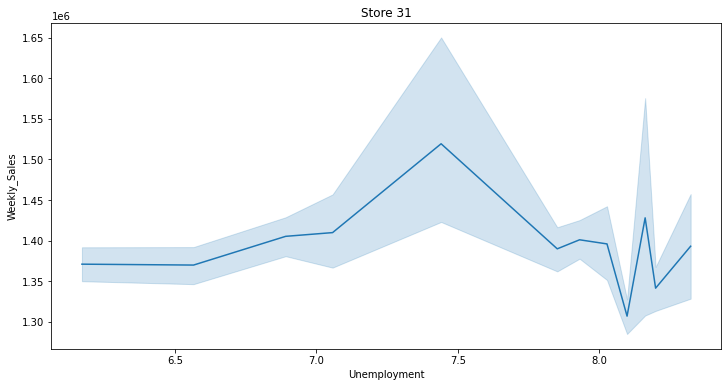

Correlation between Weekly Sales and Unemployment of Store32 is -0.09945467124759011


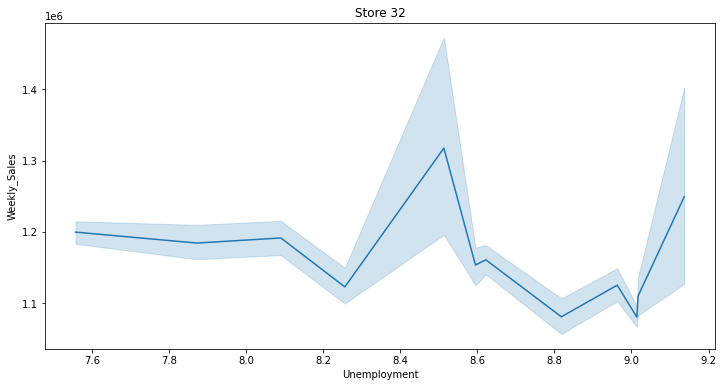

Correlation between Weekly Sales and Unemployment of Store33 is 0.10117473193757327


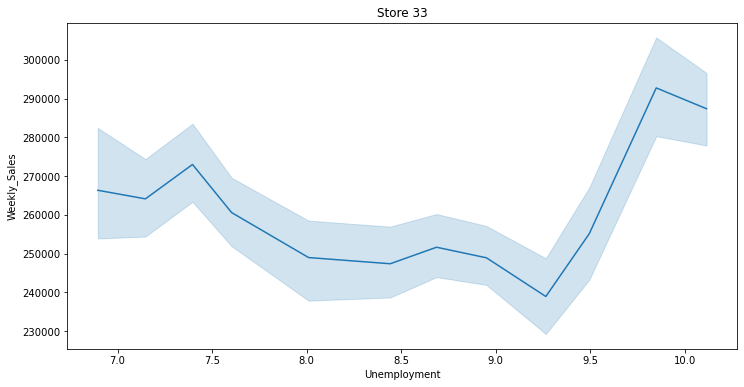

Correlation between Weekly Sales and Unemployment of Store34 is 0.01701025065278913


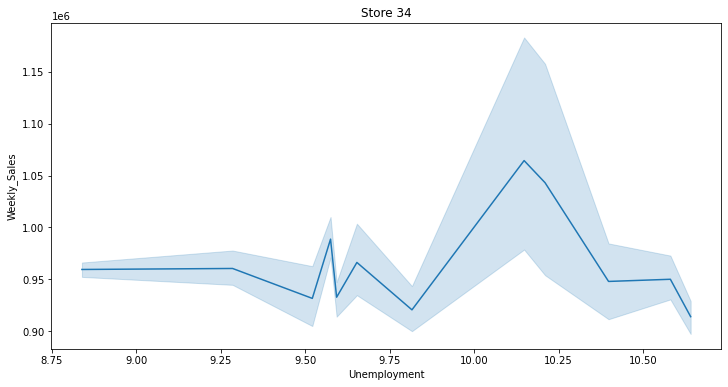

Correlation between Weekly Sales and Unemployment of Store35 is 0.4838654198192479


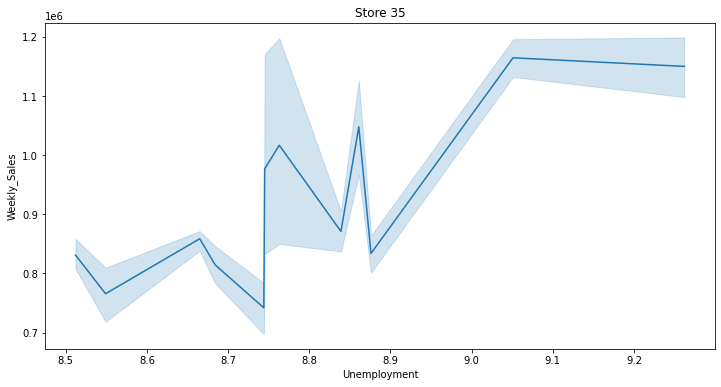

Correlation between Weekly Sales and Unemployment of Store36 is 0.8337336178415085


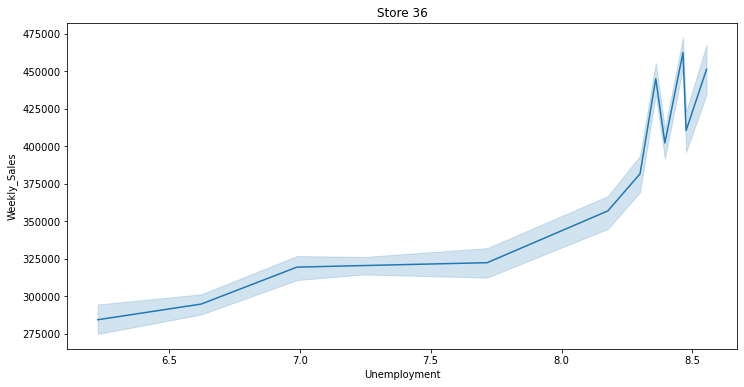

Correlation between Weekly Sales and Unemployment of Store37 is -0.22128669565468617


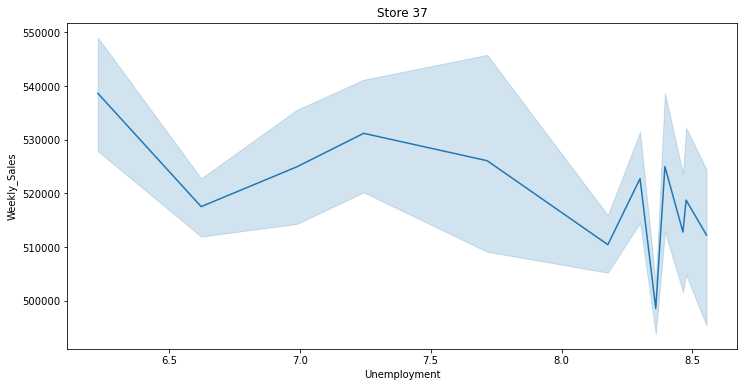

Correlation between Weekly Sales and Unemployment of Store38 is -0.7852902748572028


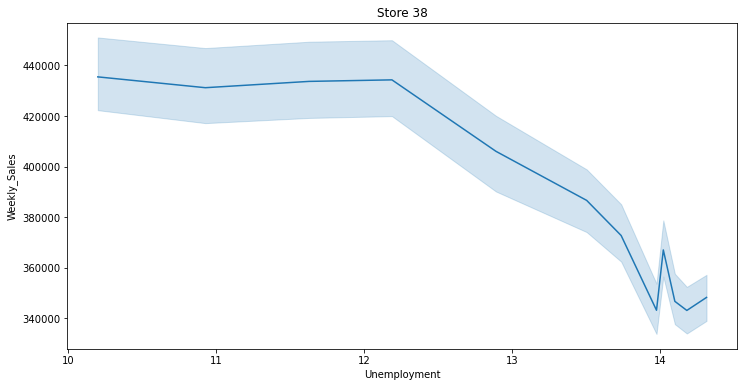

Correlation between Weekly Sales and Unemployment of Store39 is -0.38468135708616064


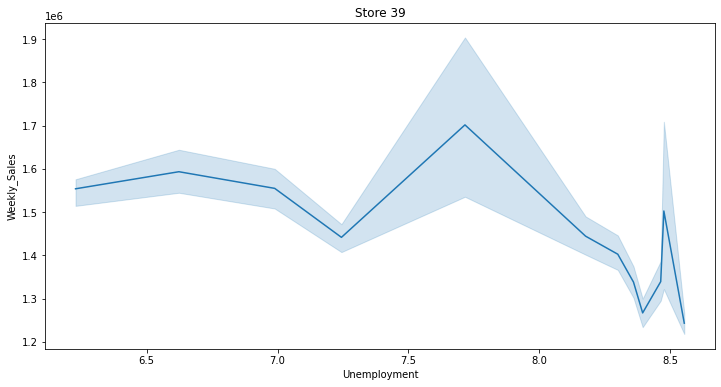

Correlation between Weekly Sales and Unemployment of Store40 is -0.11252795058812329


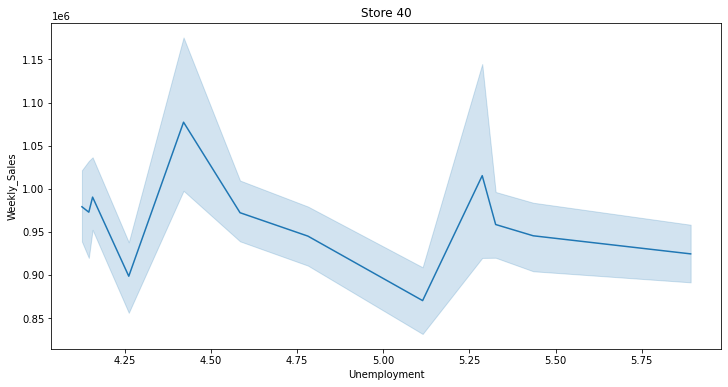

Correlation between Weekly Sales and Unemployment of Store41 is -0.3506296095634573


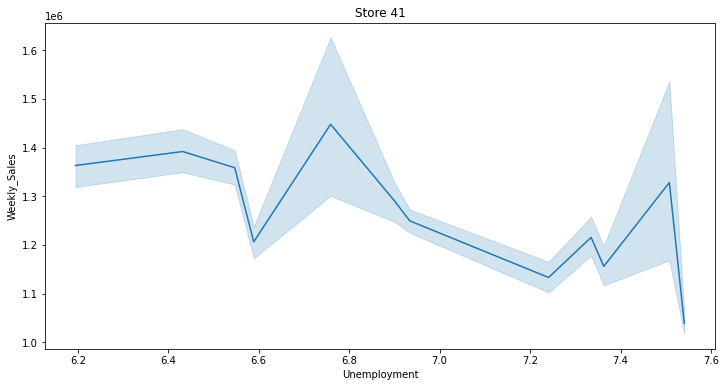

Correlation between Weekly Sales and Unemployment of Store42 is -0.3563546441574805


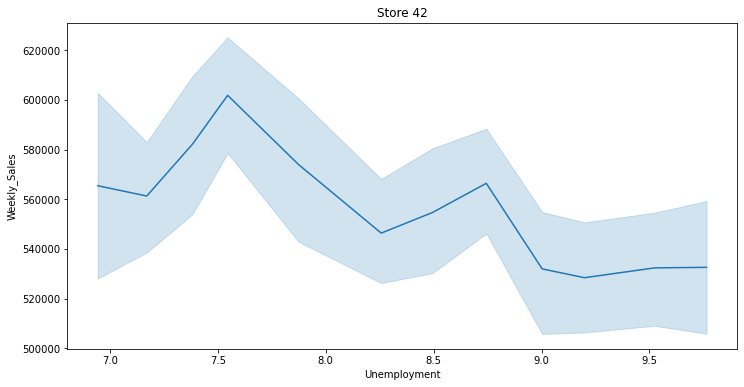

Correlation between Weekly Sales and Unemployment of Store43 is -0.20195435737205705


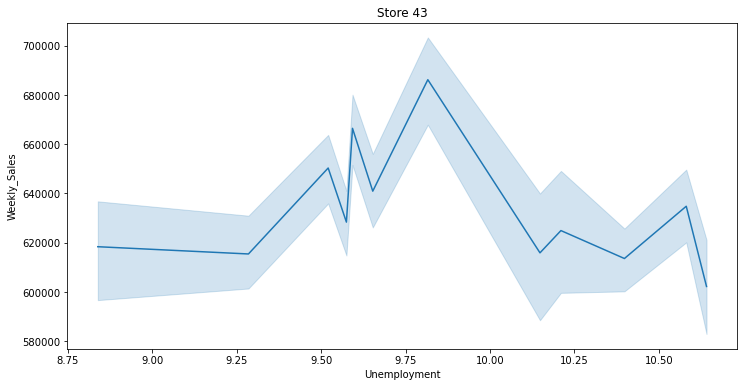

Correlation between Weekly Sales and Unemployment of Store44 is -0.7800764432910237


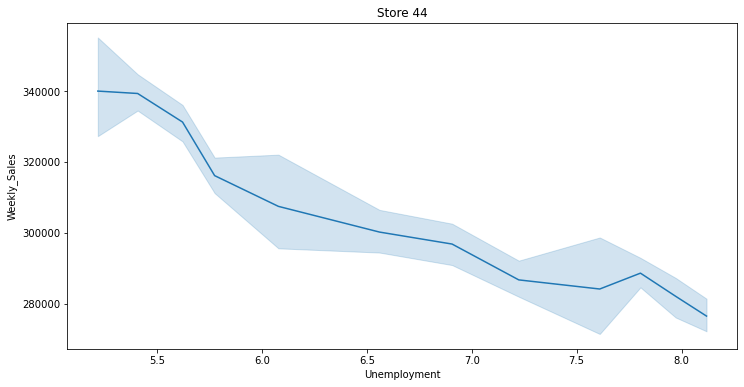

Correlation between Weekly Sales and Unemployment of Store45 is -0.004041028359856243


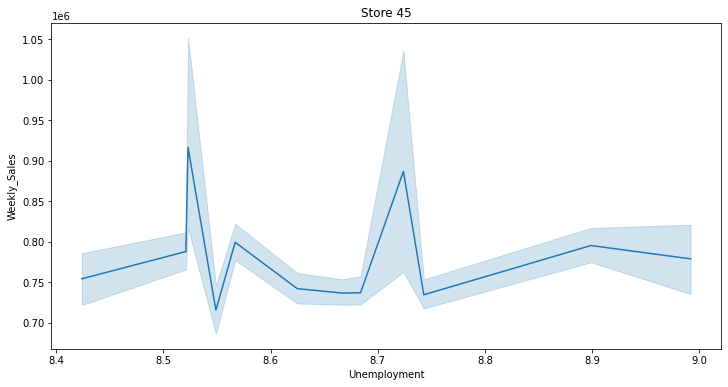


Since,Store38 has minimum correlation of -0.7852902748572028 therefore its sales is most suffering by Unemployement.




In [ ]:
corr=[0]
for i in df.Store.unique():
    print(f"Correlation between Weekly Sales and Unemployment of Store{i} is {df[df.Store==i].Weekly_Sales.corr(df[df.Store==i].Unemployment)}")
    plt.figure(figsize=(12,6))
    sns.lineplot(x=df[df.Store==i].Unemployment,y=df[df.Store==i].Weekly_Sales)
    plt.title(f"Store {i}")
    plt.show()
    corr.append(df[df.Store==i].Weekly_Sales.corr(df[df.Store==i].Unemployment))
print(f"\nSince,Store{np.array(corr).argmin()} has minimum correlation of {np.array(corr).min()} therefore its sales is most suffering by Unemployement.\n\n")

Unemplyment has a significant impact on Store-38, although its sales are increasing but not on the large scale.

### Best Performer

In [ ]:
data = df.groupby(by=df.Store)['Weekly_Sales'].agg(['sum'])
print("Top performing stores according to the historical data is Store- 20")
data[data['sum'] == data['sum'].max()]

Top performing stores according to the historical data is Store- 20


,sum
Store,
20,3.013978e+08


Top performing Store in No. 20, having a total sales of $301M.

<AxesSubplot:xlabel='Date'>

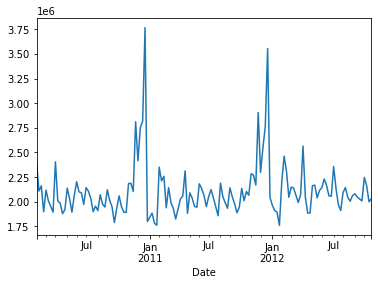

In [ ]:
df[df.Store==20]['Weekly_Sales'].plot()

### Underperforming Store

In [ ]:
data = df.groupby(by=df.Store)['Weekly_Sales'].agg(['sum'])
print("The worst performing stores according to the historical data is Store- 33")
print(f"Difference between the highest and lowest performing stores is {data['sum'].max()-data['sum'].min()}")
data[data['sum'] == data['sum'].min()]

The worst performing stores according to the historical data is Store- 33
Difference between the highest and lowest performing stores is 264237570.49999997


,sum
Store,
33,37160221.96


Least performing Store in No. 33, having a total sales of only $37M.

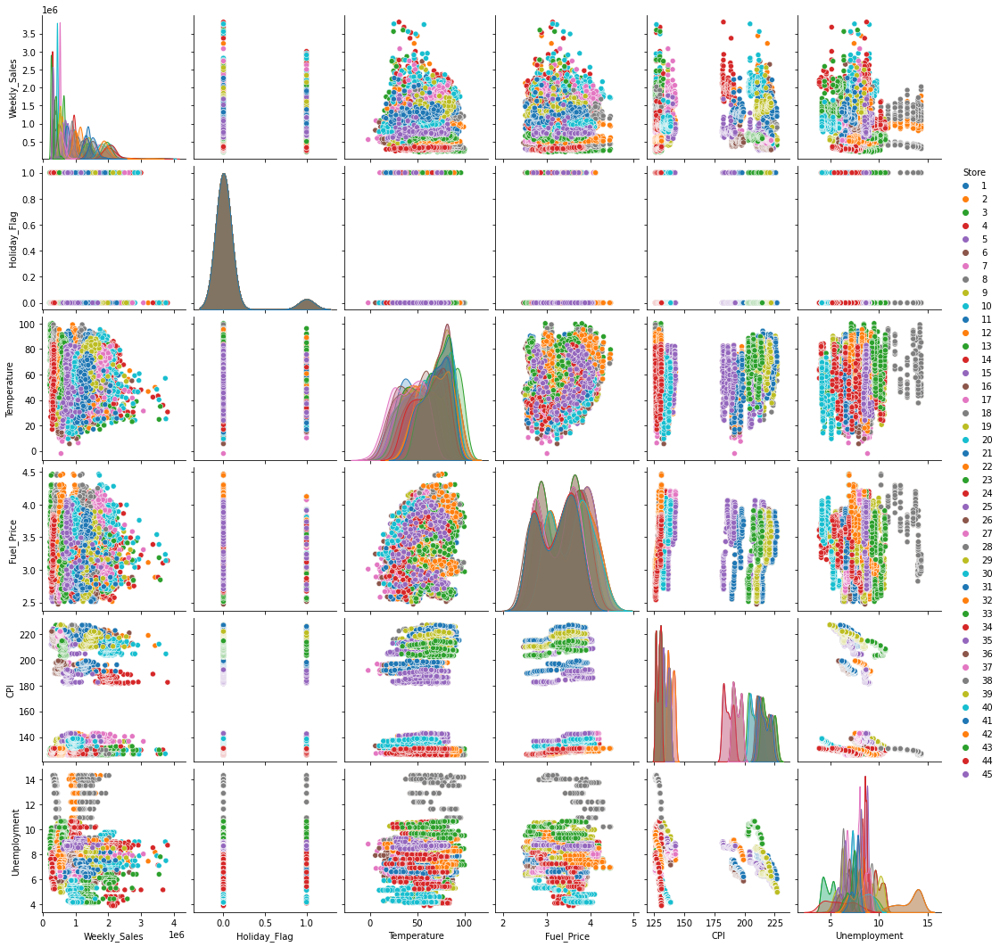

In [ ]:
sns.pairplot(df,hue='Store',palette="tab10")

## Data Preprocessing

The preprocessing of the data included the following steps:
1. First, we do data preprocessing for 1 store, then generalize them to all 45 stores.
2. Second step, and so on.

In [ ]:
data = df[df.Store==1][['Store','Weekly_Sales']]
data

,Store,Weekly_Sales
Date,,
2010-02-05,1,1643690.90
2010-02-12,1,1641957.44
2010-02-19,1,1611968.17
2010-02-26,1,1409727.59
2010-03-05,1,1554806.68
...,...,...
2012-09-28,1,1437059.26
2012-10-05,1,1670785.97
2012-10-12,1,1573072.81


<AxesSubplot:xlabel='Date', ylabel='Weekly_Sales'>

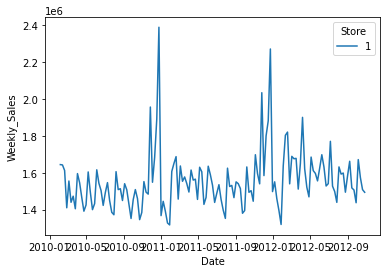

In [ ]:
sns.lineplot(x=data.index,y=data.Weekly_Sales,hue=data.Store,palette="tab10")

### Analysing the trends in data:

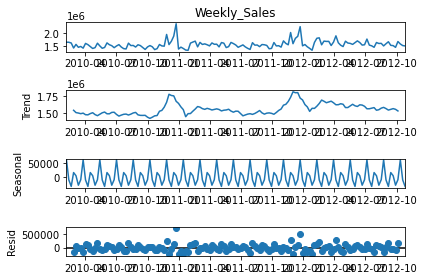

In [ ]:
seasonal_decompose(data['Weekly_Sales'][data.Store==1],period=7).plot();

We can see than there in a linear and seasonal trend availabe in the data.

Monotonic trend form data can be easily removed by applying shift and calculating the residuals.

In [ ]:
data["Shifted1"]=data['Weekly_Sales']-data['Weekly_Sales'].shift(1)
data = data.dropna()
data

,Store,Weekly_Sales,Shifted1
Date,,,
2010-02-12,1,1641957.44,-1733.46
2010-02-19,1,1611968.17,-29989.27
2010-02-26,1,1409727.59,-202240.58
2010-03-05,1,1554806.68,145079.09
2010-03-12,1,1439541.59,-115265.09
...,...,...,...
2012-09-28,1,1437059.26,-69066.80
2012-10-05,1,1670785.97,233726.71
2012-10-12,1,1573072.81,-97713.16


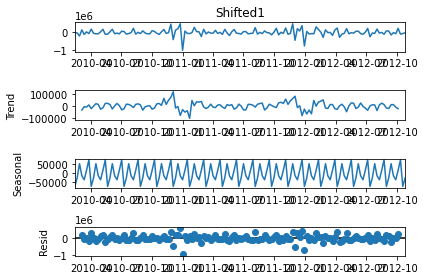

In [ ]:
seasonal_decompose(data['Shifted1'][data.Store==1],period=7).plot();

In [ ]:
data["Shifted2"]=data['Shifted1']-data['Shifted1'].shift(1)
data = data.dropna()
data

C:\Users\akpra\AppData\Local\Temp\ipykernel_1960\3298285733.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data["Shifted2"]=data['Shifted1']-data['Shifted1'].shift(1)


,Store,Weekly_Sales,Shifted1,Shifted2
Date,,,,
2010-02-19,1,1611968.17,-29989.27,-28255.81
2010-02-26,1,1409727.59,-202240.58,-172251.31
2010-03-05,1,1554806.68,145079.09,347319.67
2010-03-12,1,1439541.59,-115265.09,-260344.18
2010-03-19,1,1472515.79,32974.20,148239.29
...,...,...,...,...
2012-09-28,1,1437059.26,-69066.80,-57763.99
2012-10-05,1,1670785.97,233726.71,302793.51
2012-10-12,1,1573072.81,-97713.16,-331439.87


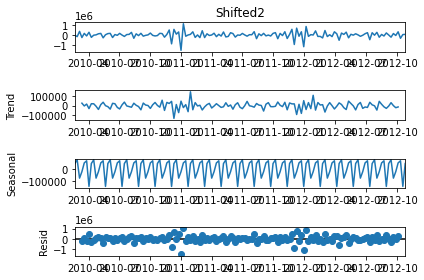

In [ ]:
seasonal_decompose(data['Shifted2'][data.Store==1],period=7).plot();

In [ ]:
data["Shifted3"]=data['Shifted2']-data['Shifted2'].shift(1)
data = data.dropna()
data

C:\Users\akpra\AppData\Local\Temp\ipykernel_1960\4017436026.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data["Shifted3"]=data['Shifted2']-data['Shifted2'].shift(1)


,Store,Weekly_Sales,Shifted1,Shifted2,Shifted3
Date,,,,,
2010-02-26,1,1409727.59,-202240.58,-172251.31,-143995.50
2010-03-05,1,1554806.68,145079.09,347319.67,519570.98
2010-03-12,1,1439541.59,-115265.09,-260344.18,-607663.85
2010-03-19,1,1472515.79,32974.20,148239.29,408583.47
2010-03-26,1,1404429.92,-68085.87,-101060.07,-249299.36
...,...,...,...,...,...
2012-09-28,1,1437059.26,-69066.80,-57763.99,-190799.64
2012-10-05,1,1670785.97,233726.71,302793.51,360557.50
2012-10-12,1,1573072.81,-97713.16,-331439.87,-634233.38


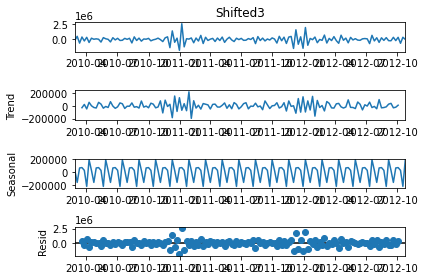

In [ ]:
seasonal_decompose(data['Shifted3'][data.Store==1],period=7).plot();

So, now the monotonic trend is diminished. So from here we can consider d for SARIMA model = 1.

### Checking for Stationarity in the data

In [ ]:
adfuller(data.Shifted1)[1]

2.1806270804197234e-10

p<0.05 indicates that data is stationary.

In [ ]:
kpss(data.Shifted1)[1]

C:\Users\akpra\anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:2022: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  warnings.warn(


0.1

p>0.05 indicates that data is stationary.

Both AdFuller test as well as KPSS test shows that the processed data has become stationary and hence can be used for further process by SARIMAX model.

### Observing AR & MR for the processed data:

C:\Users\akpra\anaconda3\lib\site-packages\statsmodels\graphics\tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


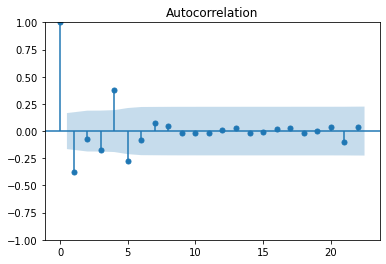

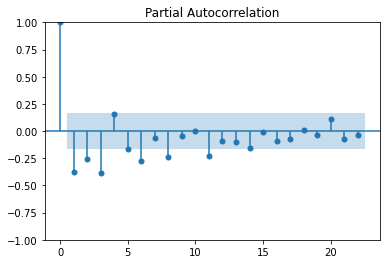

In [ ]:
plot_acf(data.Shifted1);
plot_pacf(data.Shifted1);

From PACF plot, p = 3<br>
    ACF plot,  q = 1

## SARIMAX model is to be used for time series analyisis for this dataset

SARIMAX stands for Seasonal Auto-Regressive Integrated Moving Average with eXogenous factors. It's an updated version of the ARIMA model, which includes an autoregressive integrated moving average. SARIMAX includes seasonal effects and exogenous factors along with the autoregressive and moving average components.

SARIMAX is used on data sets that have seasonal cycles. It's a time series forecasting method that can be used to predict market swings and export values.

SARIMAX has a well-defined mathematical framework, making it easier to interpret and understand. The model parameters represent the relationships between past observations and future predictions.

The first three of the four orders in a SARIMAX model are seasonal versions of the ARIMA orders. The orders are:
Seasonal autoregressive order, denoted by upper-case P
Order of seasonal integration, denoted by upper-case D
Seasonal moving average order, signified by upper-case Q

To fit a SARIMAX model, you can:
Define p, d, and q parameters to take any value between 0 and 2.
Generate all different combinations of p, q, and q triplets.

##### We have seen that there exists a seasional trend in every 1 years i.e 52 weeks. Therefore for SARIMAX is a best fit model to predict the sales in upcoming weeks.

### Spliting the data into train and test data in the ratio of 80:20.

In [ ]:
train = data.iloc[:int(len(data)*0.8)]
test = data.iloc[int(len(data)*0.8):]

### Creating and fiting into model

In [ ]:
model_sarima = SARIMAX(train.Weekly_Sales,order=(3,1,1),seasonal_order=(3,1,1,52))
model_sarima = model_sarima.fit()

C:\Users\akpra\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\akpra\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\akpra\anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


### Forecasting for next 52 weeks

<AxesSubplot:xlabel='Date'>

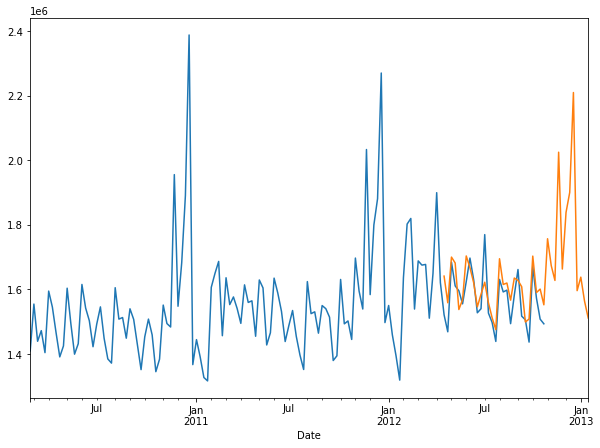

In [ ]:
y_forecasted = model_sarima.forecast(steps=(40))
data.Weekly_Sales.plot(figsize=(10,7))
y_forecasted.plot()

### Error calculation

In [ ]:
mean_absolute_percentage_error(test['Weekly_Sales'],y_forecasted[:28])

0.0323756128653231

In [ ]:
mean_absolute_error(test['Weekly_Sales'],y_forecasted[:28])

50689.54520086221

In [ ]:
median_absolute_error(test['Weekly_Sales'],y_forecasted[:28])

40778.75345686986

### Now we have optimized the time series SARIMAX model p=3, d=1, q=1<br>
### Generalizing over all 45 Stores:

In [ ]:
data = df[['Store','Weekly_Sales']]
data

,Store,Weekly_Sales
Date,,
2010-02-05,1,1643690.90
2010-02-12,1,1641957.44
2010-02-19,1,1611968.17
2010-02-26,1,1409727.59
2010-03-05,1,1554806.68
...,...,...
2012-09-28,45,713173.95
2012-10-05,45,733455.07
2012-10-12,45,734464.36


### Spliting the data into train and test data in the ratio of 80:20.

In [ ]:
store = list(range(1,46))
dic = {}

In [ ]:
for i in store:
  dic[f'store{i}'] = data[data['Store']==i].sort_index()
  dic[f'store{i}'] = dic[f'store{i}'].drop(columns='Store')

In [ ]:
train={}
test={}

In [ ]:
list(dic.keys())[:10]

['store1',
 'store2',
 'store3',
 'store4',
 'store5',
 'store6',
 'store7',
 'store8',
 'store9',
 'store10']

In [ ]:
for i in list(dic.keys()):
  train[f'{i}'] = dic[f'{i}'].iloc[:int(142*0.8)]
  test[f'{i}'] = dic[f'{i}'].iloc[int(142*0.8):]
  dic[f'{i}']["Shifted"]=dic[f'{i}']['Weekly_Sales']-dic[f'{i}']['Weekly_Sales'].shift(1)
  dic[f'{i}'] = dic[f'{i}'].dropna()
  dic[f'{i}']["Shifted2"]=dic[f'{i}']['Shifted']-dic[f'{i}']['Shifted'].shift(1)
  dic[f'{i}'] = dic[f'{i}'].dropna()
  dic[f'{i}']["Shifted2"]=dic[f'{i}']['Shifted']-dic[f'{i}']['Shifted'].shift(1)
  dic[f'{i}'] = dic[f'{i}'].dropna()
  dic[f'{i}']["Shifted3"]=dic[f'{i}']['Shifted2']-dic[f'{i}']['Shifted2'].shift(1)
  dic[f'{i}'] =dic[f'{i}'].dropna()

### Creating and fiting into model

In [ ]:
model_sarima={}

In [ ]:
for i in train.keys(): #list(train.keys())[:5]:
  model_sarima[f'{i}'] = SARIMAX(train[f'{i}']['Weekly_Sales'],order=(3,1,1),seasonal_order=(3,1,1,52))
  model_sarima[f'{i}'] = model_sarima[f'{i}'].fit()

C:\Users\akpra\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\akpra\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\akpra\anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\akpra\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\akpra\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:47

### Forecasting for next 42 weeks (30 test data + 12 week forecast)

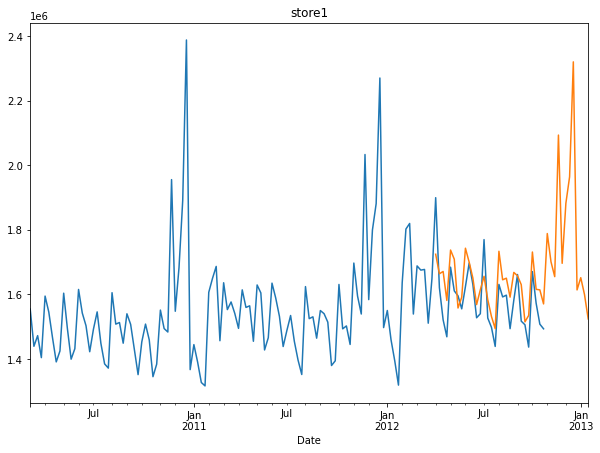

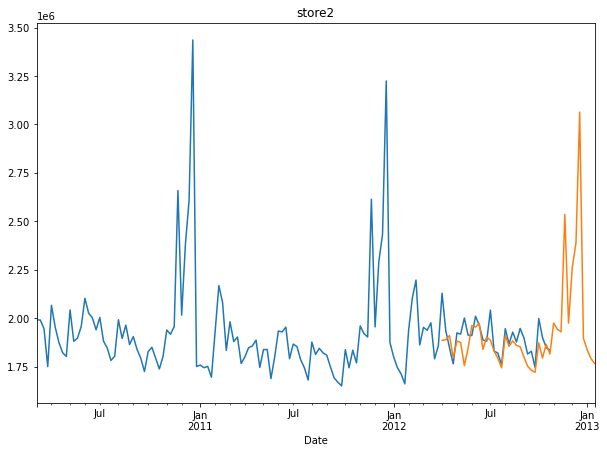

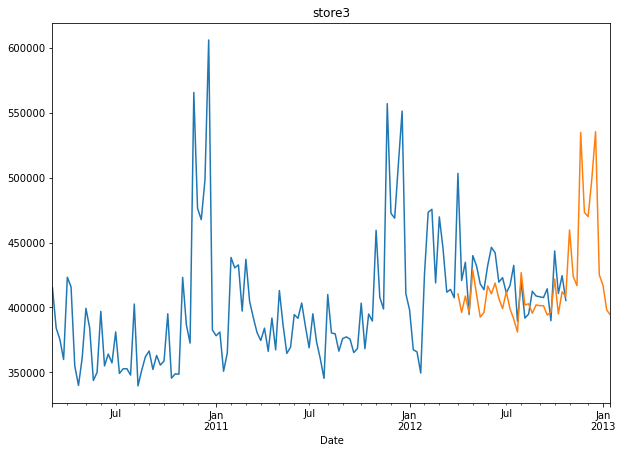

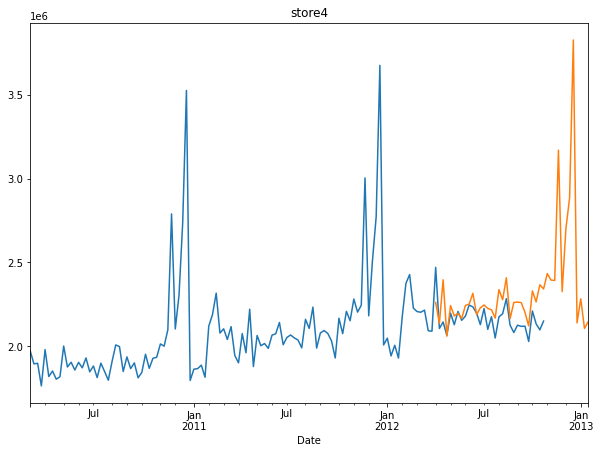

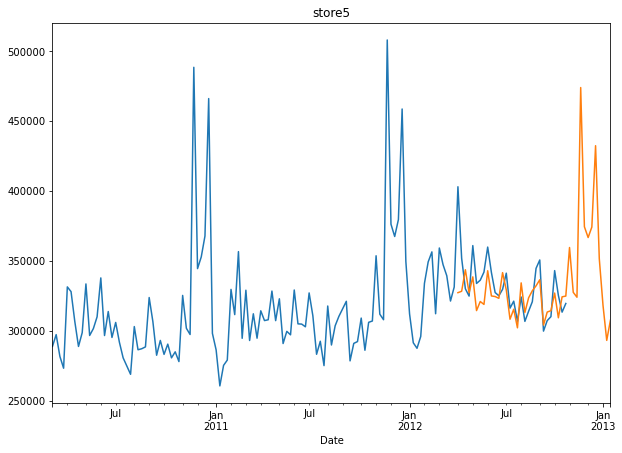

...

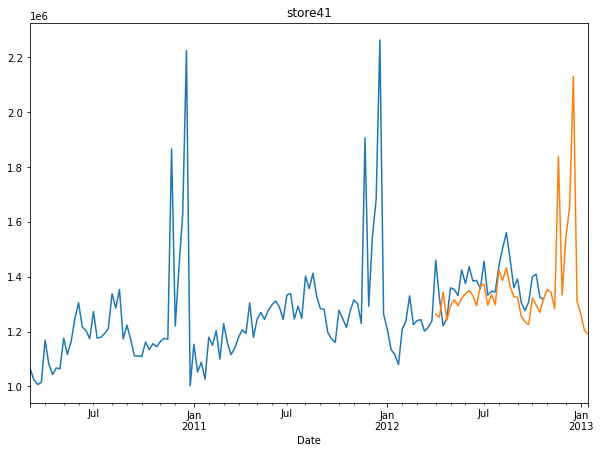

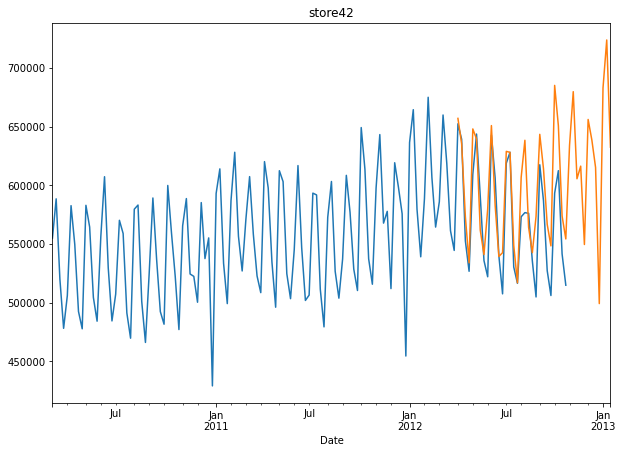

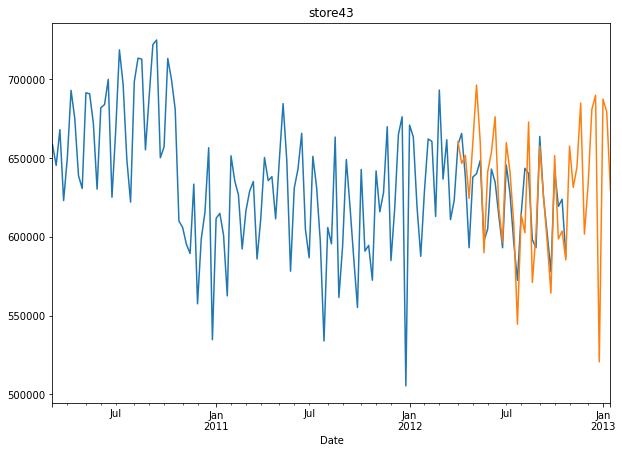

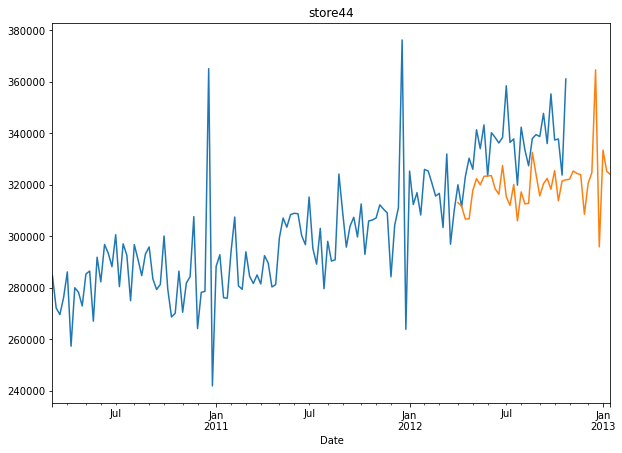

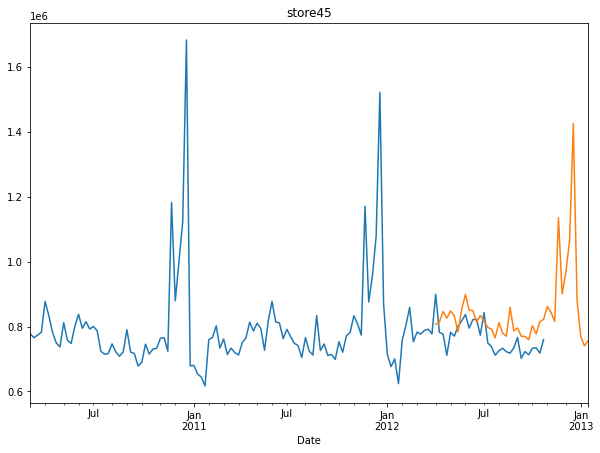

In [ ]:
y_forecasted = {}
for i in model_sarima.keys():
  y_forecasted[f'{i}'] = model_sarima[f'{i}'].forecast(steps=(42))
  dic[f'{i}'].Weekly_Sales.plot(figsize=(10,7))
  y_forecasted[f'{i}'].plot()
  plt.title(i)
  plt.show()

In [ ]:
forecast = pd.DataFrame(y_forecasted).round(1)

## Model Evaluation

In [ ]:
for i in forecast.keys():
    print(f"Mean Absolute Precentage Error for \033[1m{i.upper()}\033[0m is {mean_absolute_percentage_error(test[i]['Weekly_Sales'],forecast[i].iloc[:30]):.3f}")
    print(f"Mean Absolute Error for \033[1m{i.upper()}\033[0m is {mean_absolute_error(test[i]['Weekly_Sales'],forecast[i].iloc[:30]):.3f}")
    print(f"Median Absolute Error for \033[1m{i.upper()}\033[0m is {median_absolute_error(test[i]['Weekly_Sales'],forecast[i].iloc[:30]):.3f}","\n")

Mean Absolute Precentage Error for STORE1 is 0.045
Mean Absolute Error for STORE1 is 70786.100
Median Absolute Error for STORE1 is 58752.595 

Mean Absolute Precentage Error for STORE2 is 0.033
Mean Absolute Error for STORE2 is 64230.366
Median Absolute Error for STORE2 is 46196.355 

Mean Absolute Precentage Error for STORE3 is 0.042
Mean Absolute Error for STORE3 is 18084.939
Median Absolute Error for STORE3 is 15740.710 

Mean Absolute Precentage Error for STORE4 is 0.045
Mean Absolute Error for STORE4 is 98011.375
Median Absolute Error for STORE4 is 88602.690 

Mean Absolute Precentage Error for STORE5 is 0.038
Mean Absolute Error for STORE5 is 13312.101
Median Absolute Error for STORE5 is 11442.425 

Mean Absolute Precentage Error for STORE6 is 0.033
Mean Absolute Error for STORE6 is 52463.688
Median Absolute Error for STORE6 is 38221.365 

Mean Absolute Precentage Error for STORE7 is 0.092
Mean Absolute Error for STORE7 is 52867.187
Median Absolute Error for STORE7 is 58322.190 


The Mean Absolute Precentage Error, Mean Absolute Error, Median Absolute Error for all individual store is in the acceptable range.<br>
This model has a good accuracy for next 12 weeks, although the same model may can't work for forecasting for long period of time due to less amount of training data.

## Inferences from the Project

The evaluation report suggests that in upcomming November & December months demand is going to be increase in huge ammount.
Store stocks needs to be maintained on prior basis to avoid the issue to supply crises.<br>
Sotcks to be maintained in all stores to achieve the forecasted target as below for next 12 weeks:

In [ ]:
forecast

,store1,store2,store3,store4,store5,store6,store7,store8,store9,store10,...,store36,store37,store38,store39,store40,store41,store42,store43,store44,store45
2012-04-06,1724556.3,1885523.1,410393.3,2260521.3,327273.6,1579696.7,568895.9,964048.6,607804.8,1855027.5,...,327788.6,541127.7,423249.3,1539367.5,955443.1,1263198.7,656926.0,660554.8,313109.9,807171.1
2012-04-13,1664019.0,1888438.5,396201.7,2136051.4,328288.2,1506651.3,491854.2,931093.5,578865.2,1774676.4,...,320555.7,542150.5,392656.6,1541119.3,880164.5,1252691.6,635204.9,646734.5,311648.9,813797.0
2012-04-20,1671233.2,1910250.3,408802.4,2396310.4,343658.1,1670315.4,535951.5,954011.3,598586.4,1961876.1,...,298106.3,524634.5,392781.9,1716513.1,958732.9,1344546.0,573081.8,651728.2,306674.2,846238.4
2012-04-27,1581434.9,1796007.8,395887.5,2059622.9,327143.4,1532155.9,479280.0,883370.4,582187.3,1851000.2,...,278619.0,503038.4,373177.6,1566862.0,852901.6,1240868.4,533823.0,624441.7,306821.8,826007.8
2012-05-04,1737532.4,1881732.3,428615.4,2242515.4,338569.6,1553699.6,475592.1,958467.1,594270.3,1827933.6,...,307523.6,544173.9,454267.8,1553508.9,1016741.6,1294952.5,647938.4,659573.1,317830.3,848391.6
2012-05-11,1709181.1,1874529.4,410087.2,2180022.6,314472.0,1509621.7,483055.1,919500.7,588735.6,1717315.8,...,308785.4,512126.7,396885.7,1524694.7,908671.2,1315897.1,639434.0,696448.6,322406.2,832804.3
2012-05-18,1558087.0,1754557.6,392562.0,2195734.7,320951.8,1448602.2,493473.3,868569.0,569505.3,1725105.8,...,298130.8,532540.1,395632.7,1556548.3,915194.8,1294665.7,561677.7,659991.0,319993.3,783845.1
2012-05-25,1591450.9,1845441.1,396201.1,2165757.2,318868.1,1570426.3,525825.2,887903.8,602116.3,1745255.9,...,283416.4,506166.6,386511.4,1582209.1,974889.7,1322168.9,540869.4,589972.6,323290.6,853079.5
2012-06-01,1743212.7,1961804.0,416553.7,2243122.4,342957.5,1726677.6,611147.7,949188.9,632548.0,1787157.3,...,296845.6,502408.8,427820.6,1684043.4,1066880.9,1337828.8,579633.0,641336.1,323440.7,898905.8
2012-06-08,1699975.0,1954381.7,410539.1,2250948.1,324932.7,1634851.9,691126.2,921625.1,598710.6,1740507.3,...,297191.2,511136.3,412264.3,1611603.8,984837.5,1349847.9,650793.1,653725.2,323572.0,850281.9


<AxesSubplot:>

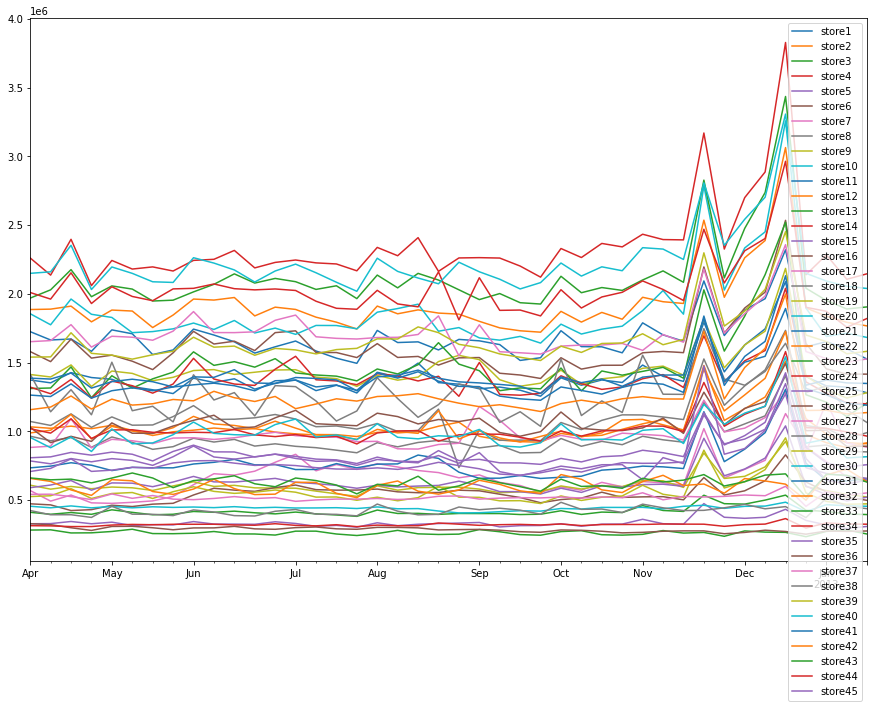

In [ ]:
forecast.plot(figsize=(15,10))

## Future Possibilities

Limitations exsist in forecast data due to less avaibility of training data.

It is clearily visible that the trend is repeating itself in every year but we have availbility of only only 2 year data, therefore we cannot predict future demand for a very long time.<br>
With the span of time, we can train our model for subsequent few more years to achevie a significant accuracy.

## Conclusion

Walmart data is availabe with train data covering seasonal repeat of 2 years. and a small increasing trends in weekly sales.
For datasets with trend and seasionality, SARIMAX is used to predict the data in future tense.

Maximum Sales for each Store:

In [ ]:
forecast.max().sort_values(ascending=False)

store4     3828040.6
store13    3435282.5
store20    3307230.9
store10    3257692.7
store2     3063632.6
store14    2963916.1
store6     2534300.9
store23    2520534.4
store39    2451966.4
store27    2357293.0
store1     2320208.2
store19    2184709.6
store41    2131178.3
store11    2087886.2
store24    2040439.0
store32    1998252.0
store31    1892989.3
store28    1746381.1
store18    1733888.9
store22    1725972.2
store34    1579548.9
store40    1541396.4
store12    1509456.0
store26    1493325.1
store35    1474759.8
store45    1425291.9
store8     1404483.2
store21    1305591.6
store17    1285906.0
store25    1271572.9
store7     1128317.2
store15    1038969.4
store29     951969.8
store9      925789.3
store16     828222.3
store42     723748.2
store43     696448.6
store37     599626.0
store3      535355.5
store38     513121.7
store30     483984.0
store5      473898.4
store44     364645.3
store36     327788.6
store33     287356.8
dtype: float64

Store-4 is going to have a maximum sales in upcoming next 3 months.<br>
Walmart needs the maintain the sufficient stocks in all respective stores to meet the customer requirements.

## References

1. Kaggle
2. Machine Learning Mastery - Jason Brownlee
3. Intellipaat